In [1]:
# import required libraries
# data manipulation
import pandas as pd
import numpy as np

# data visualization
import matplotlib.pyplot as plt

# training neural networks
import torch
import torch.nn as nn
import torch.nn.functional as F

#progress bar
from tqdm import tqdm

# use this to import r packages into python
from rpy2 import robjects
from rpy2.robjects import numpy2ri,r
from rpy2.robjects.packages import importr

# import copula package from r to generate copula samples
copula=importr('copula')

# use this to transform data into normal margins for better fitting 
from scipy import stats
from scipy.stats import norm

# use this to perform debugging
from IPython.core.debugger import set_trace

# use pickle to save model
import pickle

# import time to measure time required to finish running the program
import time
from IPython.core.magics.execution import _format_time

In [2]:
# record start time
start_time=time.time()
# Function to print the total execution time
def notebook_execution_time():
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"\nTotal execution time: {_format_time(elapsed_time)}")

# Register post-execution hook to print the total time after the last cell runs
def finish_run_cell():
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Cell executed in: {_format_time(elapsed_time)}")

In [3]:
# set seed for reproducibility
# use this to set seed later
base=importr('base')

# set seed in r
base.set_seed(235)

# set seed in np
np.random.seed(235)

# set seed in torch
torch.manual_seed(235)

# If using CUDA, set seed to CUDA
if torch.cuda.is_available():
    torch.cuda.manual_seed(235)
    torch.cuda.manual_seed_all(235)  # for multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# activate the conversion from python numpy to r
numpy2ri.activate()

In [4]:
# Diffusion Model
class Diffusion:
    def __init__(self,beta_start=0.0001,beta_end=0.02,timesteps=1000):
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.timesteps = timesteps

    # 1. calculate the corruption alpha for each timestep
    def gen_beta_schedule(self,**kwargs):
        if kwargs:
            self.beta_start=kwargs["beta_start"]
            self.beta_end=kwargs["beta_end"]
            self.timesteps=kwargs["timesteps"]
        beta_schedule=torch.linspace(self.beta_start,self.beta_end,self.timesteps)
        self.beta_schedule=beta_schedule
        return self
    
    def calc_alpha(self):
        alpha=torch.cumprod(1-self.beta_schedule,dim=0)
        self.alpha=alpha
        return self
    
    # 2. sample datapoint from dataset, t from timesteps, noise vector from N(0,Id)
    def sample_datapoint(self,datasize_N,sampling_size=50):
        # generate index to sample datapoint later
        ind=torch.randint(datasize_N,size=(sampling_size,))
        return ind
    
    def sample_timestep(self):
        # sample one timestep at a time
        t=torch.randint(self.timesteps,size=(1,))
        return t
    
    def sample_noise(self,size):
        # sample noise vector from N(0,Id)
        # since we are sampling from a diagonal identity matrix, each feature is independent
        eta=torch.normal(0,1,size=size)
        return eta

    # evaluate the forward decoder pass, eg calculate X-> Z_t, corrupt X into noise observation, Z_t
    def forward_encoder(self,X,t,eta):
        # extract alpha at timestep t
        alpha_t=self.alpha[t]
        # calculate Z, the noisy latent variable
        Z=torch.sqrt(alpha_t)*X + torch.sqrt(1-alpha_t)*eta
        return Z

    # train the reverse decoder (which is a neural network)- we use 2 layer MLP with d=300
    def train_reverse_decoder(self,X,Y,initialized_neural_network,sampling_size=50):
        # 1. sample data (size=sampling_size) from dataset, book uses one datapoint
        # use the smaller set of observations to generate the index for sampling observations
        if X.shape[0]<=Y.shape[0]:
            X_size=X.shape
        else:
            X_size=Y.shape
        # sample data for training
        ind=self.sample_datapoint(X_size[0],sampling_size=sampling_size)
        X_n=X[ind]
        Y_n=Y[ind]
        
        # size of sample used to train
        X_n_size=X_n.shape

        # 2. sample timestep
        t=self.sample_timestep()

        # 3. sample noise vector 
        eta=self.sample_noise(X_n_size)

        # 4. call the forward encoder step to generate Z_n, noisy latent variable
        Z_n=self.forward_encoder(X_n,t,eta)

        # 5. train the neural network with noisy latent variable generated from X_n, [independent observations (feature), Z_n] and Y_n, dependent observations (target)
        # learn neural network to approximate Y_n with Z_n
        initialized_neural_network.train(Z_n,Y_n)

        # save the trained model
        self.reverse_decoder=initialized_neural_network

        return self
    
    # undo the noise added to the data, reverting the noisy latent variable to samples of original data
    def undo_noise(self,Z):
        Y=self.reverse_decoder.predict(Z)
        return Y   

In [5]:
# define Maximum Mean Discrepancy metric
from torch.nn.modules.loss import _Loss

# default settings from prasad avinash paper
class MMDLoss(_Loss):
    def __init__(self, n_kernels=6, bandwidths=[0.001,0.01,0.15,0.25,0.50,0.75]):
        super().__init__()
        self.n_kernels = n_kernels
        self.bandwidths = torch.tensor(bandwidths)[:,None,None]
    
    def kernel(self, x, y):
        L2_distance=torch.cdist(x,y,p=2.0)
        # add the channel dimension for broadcasting with bandwidth
        kernel=torch.exp(-L2_distance[None,:]/self.bandwidths).sum(dim=0)
        return kernel

    def forward(self, X, Y):
        XX=self.kernel(X,X).mean()
        XY=self.kernel(X,Y).mean()
        YY=self.kernel(Y,Y).mean()
        return torch.sqrt(XX-2*XY+YY)

In [6]:
# d of copula investigated d={2, 50, 100,500} 
# 300 dim hidden layer
class MLP(nn.Module):
    def __init__(self,dim_input,dim_output,lr=0.0005):
        #inherit from nn.Module (base class for all torch modules)
        super().__init__()

        # store current loss
        self.loss=[]

        #build the model
        self.layers=nn.Sequential(
            #1st layer-input: dim_input dim, output: 15 dim in Dense linear layer
            nn.Linear(dim_input,300),
            #apply Relu activation function
            nn.ReLU(),
            # apply batch normalization
            nn.BatchNorm1d(300),
            #2nd layer-input: 500 dim, output: 300 dim in Dense linear layer
            nn.Linear(300,dim_output),
            # add sigmoid to constraint output to a probability [0,1]
            nn.Sigmoid()
        )
        self.lr=lr
        self.opt=torch.optim.Adam(self.parameters(),lr=lr)
    

    def forward(self,x):
        #forward pass-calculate the output
        return self.layers(x)
    
    # take in minibatch of X_n, one Z_t and perform backpropagation (book performs sgd- we use minibatch instead)
    def train(self,x,y,loss_fn=nn.MSELoss(),opt=None):
        # train the model on the x and z_t inputs
        if opt==None:
            opt=self.opt
            
        #zero the gradients before backward pass so that we do accumulate gradients from last epoch
        opt.zero_grad()

        #forward pass
        y_pred=self.forward(x)

        #calculate loss (reshape target to have similar shape as to match dim of y_pred)
        loss=loss_fn(y_pred,y.reshape(y_pred.shape))

        #perform backward pass
        loss.backward()

        # perform gradient clipping by setting max norm of gradients to 1
        torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=0.5)

        #update weights
        opt.step()  

        #update current loss (initialized in first part of class)
        self.curr_loss=loss.item()
        self.loss.append(loss.item())

    def predict(self,x):
        #use model to generate predictions, switch off gradient calculations to improve inference speed
        with torch.no_grad():
            y_pred=self.forward(x)
        return y_pred

In [7]:
# general function to train the model with copula samples

# map X to U' first
def train_copula_samples(diffusion_model,neural_network,ind_samples,copula_samples,epochs=30,sampling_size=60000):
    # since using MSE, feed the whole dataset into the diffusion model, sample in diffusion model
    #training loop
    for i in range(epochs):
            # call the train function from the model passed to train model
            X_ind=ind_samples
            Y_dep=copula_samples
            diffusion_model.train_reverse_decoder(X=X_ind,Y=Y_dep,initialized_neural_network=neural_network,sampling_size=sampling_size)
            print(f"Epoch {i}, Current Loss = {diffusion_model.reverse_decoder.curr_loss}")
    print("Training Complete")

In [8]:
# we are going to generate copulas for Gumbel, Gaussian, Marshall-Oilkin

# start with gausssian first
# instantiate Gaussian copula
gaussianCopula2d=copula.normalCopula(dim=2,p=0.8)

# generate samples from Gaussian copula
uniform_gaussian_samples_r2d=copula.rCopula(60000,gaussianCopula2d)
uniform_gaussian_samples2d=torch.clamp(torch.Tensor(np.array(uniform_gaussian_samples_r2d)),min=1e-5,max=1-1e-5)

# convert the U'_dep to U_ind through Rosenblatt transform
ind_uniform_gaussian_samples_r2d=copula.cCopula(u=uniform_gaussian_samples_r2d,copula=gaussianCopula2d)
ind_uniform_gaussian_samples2d=torch.clamp(torch.Tensor(np.array(ind_uniform_gaussian_samples_r2d)),min=1e-5,max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gaussian_samples2d=norm.ppf(ind_uniform_gaussian_samples2d)
ind_gaussian_samples2d=torch.Tensor(ind_gaussian_samples2d)

# Copula samples, U_dep -> Rosenblatt transform -> U_ind independent samples corresponding to copula samples-> Gaussian ppf-> normal margins

In [9]:
# Diffusion model for Gaussian

# initialize diffusion model with parameters
diff2d=Diffusion(timesteps=10)
diff2d.gen_beta_schedule()
diff2d.calc_alpha()

# initialize neural network
mlp_gaussian2d=MLP(dim_input=2,dim_output=2)

train_copula_samples(diff2d,mlp_gaussian2d,ind_gaussian_samples2d,uniform_gaussian_samples2d,epochs=300)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

c:\Users\User\anaconda3\envs\ml_win_old\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Epoch 0, Current Loss = 0.11787449568510056
Epoch 1, Current Loss = 0.10676757991313934
Epoch 2, Current Loss = 0.09606330096721649
Epoch 3, Current Loss = 0.08653899282217026
Epoch 4, Current Loss = 0.07832125574350357
Epoch 5, Current Loss = 0.06775068491697311
Epoch 6, Current Loss = 0.06007291376590729
Epoch 7, Current Loss = 0.05196862667798996
Epoch 8, Current Loss = 0.047329217195510864
Epoch 9, Current Loss = 0.04248438775539398
Epoch 10, Current Loss = 0.0330430306494236
Epoch 11, Current Loss = 0.03160598501563072
Epoch 12, Current Loss = 0.025217700749635696
Epoch 13, Current Loss = 0.02393820323050022
Epoch 14, Current Loss = 0.01644216477870941
Epoch 15, Current Loss = 0.019597161561250687
Epoch 16, Current Loss = 0.01412141788750887
Epoch 17, Current Loss = 0.009271994233131409
Epoch 18, Current Loss = 0.00920939166098833
Epoch 19, Current Loss = 0.008732342161238194
Epoch 20, Current Loss = 0.005672169849276543
Epoch 21, Current Loss = 0.011815161444246769
Epoch 22, Curr

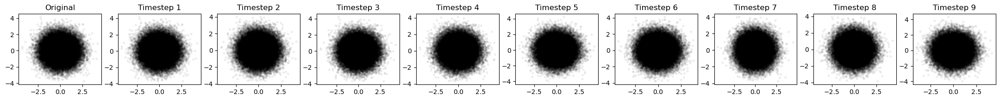

In [10]:
# plot out the original independent samples
plt.figure(figsize=(30, 2))
plt.subplot(1, 11, 1)
plt.scatter(ind_gaussian_samples2d[:,0],ind_gaussian_samples2d[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Original")

# plot out the corrupted samples
timesteps_to_plot=[1,2,3,4,5,6,7,8,9]
for idx,timestep in enumerate(timesteps_to_plot):
    # Run the unflattened image through the forward encoder
    eta=diff2d.sample_noise(ind_gaussian_samples2d.shape)
    corrupted_data=diff2d.forward_encoder(ind_gaussian_samples2d,timestep,eta)
    # Plot the corrupted independent data
    plt.subplot(1, 11, idx + 2)
    plt.scatter(corrupted_data[:,0],corrupted_data[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
    plt.title(f'Timestep {timestep}')

In [11]:
# to save our Neural network model
torch.save(mlp_gaussian2d, 'mlp_gaussian_MSE2d.pth')

# Load the entire model
# mlp_gaussian2d = torch.load('mlp_gaussian_MSE2d.pth')
# mlp_gaussian2d.eval()  # Set the model to evaluation mode
# diff2d.reverse_decoder=mlp_gaussian2d

([<matplotlib.axis.YTick at 0x190b43e0220>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

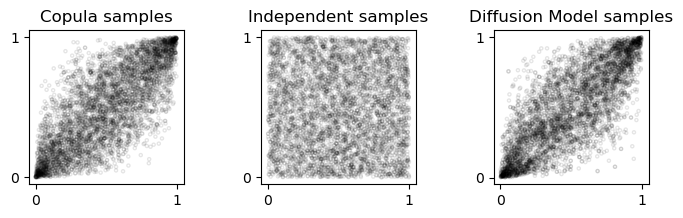

In [12]:
# randomly sample 200 samples from copula/independent samples to plot out the graphs
ind=torch.randint(low=0,high=60000,size=(5000,))

# dependent samples
x,y=np.array(uniform_gaussian_samples2d[ind,0]),np.array(uniform_gaussian_samples2d[ind,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1, edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_gaussian_samples2d[ind,0]),np.array(ind_uniform_gaussian_samples2d[ind,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent gaussians
new_gaussian2d=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
# pass the observed data through the reverse decoder to get pseudo copula samples
gaussian_diff2d=diff2d.undo_noise(new_gaussian2d)
x,y=np.array(gaussian_diff2d[ind_diff,0]),np.array(gaussian_diff2d[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

In [13]:
# run bootstrap to perform MMD calculation test on the output of neural network and copula
# bootstrap to get a range for boxplot

def MMD_bootstrap(copula_f,samples,B,batch_size=1000):
    MMD_results=[]
    
    for i in range(B):
        # randomly sample "batch_size" of samples 
        batch_ind=torch.randint(low=0,high=samples.shape[0],size=(batch_size,))
        # extract the batch of samples
        samples_=torch.Tensor(samples[batch_ind])
        copula_samples=torch.Tensor(np.array(copula.rCopula(len(batch_ind),copula_f)))
        # compute MMD Loss
        result=MMDLoss()(copula_samples,samples_)
        MMD_results.append(result)
    MMD_results=np.array(MMD_results)

    return MMD_results

Diffusion Model MMD: 0.0529952347278595 Copula MMD: 0.0449424684047699


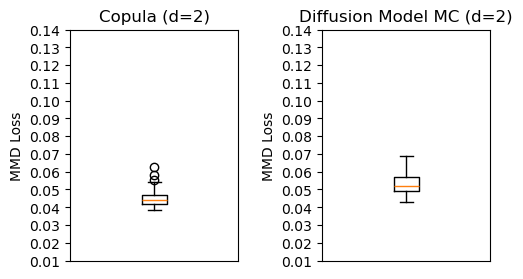

In [14]:
# calculate MMD for Copula and Diffusion Model
MMD_gaussian_copula2d=MMD_bootstrap(gaussianCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula2d))),B=100,batch_size=5000)
MMD_gaussian_diffusion2d=MMD_bootstrap(gaussianCopula2d,gaussian_diff2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_gaussian_copula2d
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion2d
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")
print(f"Diffusion Model MMD: {np.mean(MMD_gaussian_diffusion2d)}",f"Copula MMD: {np.mean(MMD_gaussian_copula2d)}")

In [15]:
# save the MMD results
np.save('MMD_gaussian_copula2d.npy',MMD_gaussian_copula2d)
np.save('MMD_gaussian_diffusion2d.npy',MMD_gaussian_diffusion2d)

# load the MMD results
# MMD_gaussian_copula2d=np.load('MMD_gaussian_copula2d.npy')
# MMD_gaussian_diffusion2d=np.load('MMD_gaussian_diffusion2d.npy')

In [16]:
# check whether diffusion models can be trained with small number of samples - important for finance usages that have limited data

# Diffusion model for Gaussian
# sample from the previous copula samples
ind_small=torch.randint(low=0,high=60000,size=(5000,))

# initialize diffusion model with parameters
diff2dsmall=Diffusion(timesteps=10)
diff2dsmall.gen_beta_schedule()
diff2dsmall.calc_alpha()

# initialize neural network
mlp_gaussian2dsmall=MLP(dim_input=2,dim_output=2)

train_copula_samples(diff2dsmall,mlp_gaussian2dsmall,ind_gaussian_samples2d[ind_small,:],uniform_gaussian_samples2d[ind_small,:],epochs=2000,sampling_size=5000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.07046996802091599
Epoch 1, Current Loss = 0.060564301908016205
Epoch 2, Current Loss = 0.05427101254463196
Epoch 3, Current Loss = 0.046518806368112564
Epoch 4, Current Loss = 0.04149968922138214
Epoch 5, Current Loss = 0.03403386101126671
Epoch 6, Current Loss = 0.03101908229291439
Epoch 7, Current Loss = 0.02912864461541176
Epoch 8, Current Loss = 0.02535729669034481
Epoch 9, Current Loss = 0.019251815974712372
Epoch 10, Current Loss = 0.014834956265985966
Epoch 11, Current Loss = 0.015561304986476898
Epoch 12, Current Loss = 0.010362166911363602
Epoch 13, Current Loss = 0.010756729170680046
Epoch 14, Current Loss = 0.008639945648610592
Epoch 15, Current Loss = 0.005820440128445625
Epoch 16, Current Loss = 0.01101133693009615
Epoch 17, Current Loss = 0.006093000061810017
Epoch 18, Current Loss = 0.011837173253297806
Epoch 19, Current Loss = 0.00830197986215353
Epoch 20, Current Loss = 0.005701154470443726
Epoch 21, Current Loss = 0.00920594297349453
Epoch 22

([<matplotlib.axis.YTick at 0x190b4f93e20>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

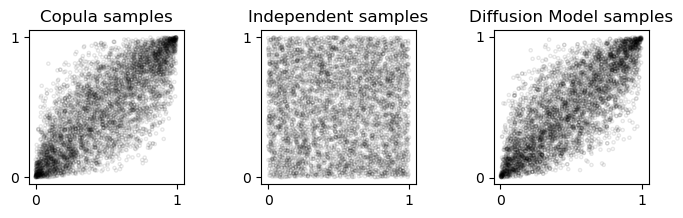

In [17]:
ind=torch.randint(low=0,high=60000,size=(5000,))
# dependent samples
x,y=np.array(uniform_gaussian_samples2d[ind,0]),np.array(uniform_gaussian_samples2d[ind,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1, edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_gaussian_samples2d[ind,0]),np.array(ind_uniform_gaussian_samples2d[ind,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent gaussians
new_gaussian2dsmall=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))
# pass the observed data through the reverse decoder to get pseudo copula samples
gaussian_diff2dsmall=diff2dsmall.undo_noise(new_gaussian2dsmall)
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
x,y=np.array(gaussian_diff2dsmall[ind_diff,0]),np.array(gaussian_diff2dsmall[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

In [18]:
# to save our Neural network model
torch.save(mlp_gaussian2dsmall, 'mlp_gaussian_MSE2dsmall.pth')

# Load the entire model
# mlp_gaussian2dsmall = torch.load('mlp_gaussian_MSE2dsmall.pth')
# mlp_gaussian2dsmall.eval()  # Set the model to evaluation mode
# diff2dsmall.reverse_decoder=mlp_gaussian2dsmall

Copula MMD: 0.045046385 Diffusion Model MMD: 0.06510584


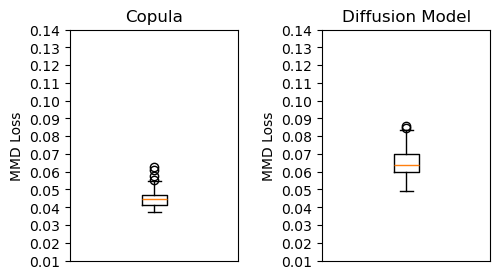

In [19]:
# calculate MMD for Copula and Diffusion Model
MMD_gaussian_copula2dsmall=MMD_bootstrap(gaussianCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula2d))),B=100,batch_size=5000)
MMD_gaussian_diffusion2dsmall=MMD_bootstrap(gaussianCopula2d,gaussian_diff2dsmall,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_gaussian_copula2dsmall
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion2dsmall
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model")
print("Copula MMD:",np.mean(MMD_gaussian_copula2dsmall),"Diffusion Model MMD:",np.mean(MMD_gaussian_diffusion2dsmall))

In [20]:
# save the MMD results
np.save('MMD_gaussian_copula2dsmall.npy',MMD_gaussian_copula2dsmall)
np.save('MMD_gaussian_diffusion2dsmall.npy',MMD_gaussian_diffusion2dsmall)
# load the MMD results
# MMD_gaussian_copula2dsmall=np.load('MMD_gaussian_copula2dsmall.npy')
# MMD_gaussian_diffusion2dsmall=np.load('MMD_gaussian_diffusion2dsmall.npy')

In [21]:
# scale to higher dimensions

# instantiate Gaussian copula
gaussianCopula50d=copula.normalCopula(dim=50,p=0.8)

# generate samples from Gaussian copula
uniform_gaussian_samples_r50d=copula.rCopula(200000,gaussianCopula50d)
uniform_gaussian_samples50d=torch.clamp(torch.Tensor(np.array(uniform_gaussian_samples_r50d)),min=1e-5,max=1-1e-5)

# convert the U'_dep to U_ind through Rosenblatt transform
ind_uniform_gaussian_samples_r50d=copula.cCopula(u=uniform_gaussian_samples_r50d,copula=gaussianCopula50d)
ind_uniform_gaussian_samples50d=torch.clamp(torch.Tensor(np.array(ind_uniform_gaussian_samples_r50d)),min=1e-5,max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gaussian_samples50d=norm.ppf(ind_uniform_gaussian_samples50d)
ind_gaussian_samples50d=torch.Tensor(ind_gaussian_samples50d)

In [22]:
# scale to higher dimensions
# Diffusion model for Gaussian
# initialize diffusion model with parameters
diff50d=Diffusion(timesteps=10)
diff50d.gen_beta_schedule()
diff50d.calc_alpha()

# initialize neural network
mlp_gaussian50d=MLP(dim_input=50,dim_output=50)

train_copula_samples(diff50d,mlp_gaussian50d,ind_gaussian_samples50d,uniform_gaussian_samples50d,epochs=500)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.10062864422798157
Epoch 1, Current Loss = 0.097719207406044
Epoch 2, Current Loss = 0.09548791497945786
Epoch 3, Current Loss = 0.09295826405286789
Epoch 4, Current Loss = 0.09037813544273376
Epoch 5, Current Loss = 0.08763609081506729
Epoch 6, Current Loss = 0.08546769618988037
Epoch 7, Current Loss = 0.08314019441604614
Epoch 8, Current Loss = 0.08021659404039383
Epoch 9, Current Loss = 0.07867632061243057
Epoch 10, Current Loss = 0.07600006461143494
Epoch 11, Current Loss = 0.07434232532978058
Epoch 12, Current Loss = 0.07221071422100067
Epoch 13, Current Loss = 0.06972675770521164
Epoch 14, Current Loss = 0.06616691499948502
Epoch 15, Current Loss = 0.06576697528362274
Epoch 16, Current Loss = 0.06262804567813873
Epoch 17, Current Loss = 0.060209255665540695
Epoch 18, Current Loss = 0.05802847817540169
Epoch 19, Current Loss = 0.05609278008341789
Epoch 20, Current Loss = 0.0560913011431694
Epoch 21, Current Loss = 0.05302049592137337
Epoch 22, Current Loss

In [23]:
# to save our Neural network model
torch.save(mlp_gaussian50d, 'mlp_gaussian_MSE_50d.pth')

# Load the entire model
# mlp_gaussian50d = torch.load('mlp_gaussian_MSE50d.pth')
# mlp_gaussian50d.eval()  # Set the model to evaluation mode
# diff50d.reverse_decoder=mlp_gaussian50d

Copula MMD: 0.050005726516246796, Diffusion Model MMD: 0.055222585797309875


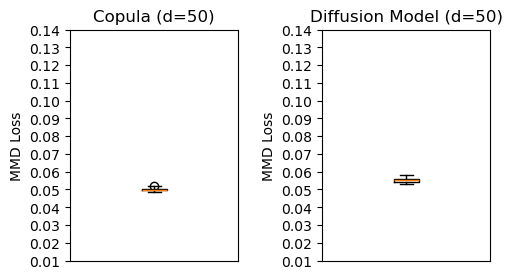

In [24]:
# generate new samples from neural network
# simulate independent gaussians
new_gaussian50d=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(50),torch.eye(50)).sample(torch.Size([20000]))
# pass the observed data through the reverse decoder to get pseudo copula samples
gaussian_diff50d=diff50d.undo_noise(new_gaussian50d)

# calculate MMD for Copula and Diffusion Model
MMD_gaussian_copula50d=MMD_bootstrap(gaussianCopula50d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula50d))),B=100,batch_size=5000)
MMD_gaussian_diffusion50d=MMD_bootstrap(gaussianCopula50d,gaussian_diff50d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_gaussian_copula50d
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=50)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion50d
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=50)")
print(f"Copula MMD: {np.mean(MMD_gaussian_copula50d)}, Diffusion Model MMD: {np.mean(MMD_gaussian_diffusion50d)}")

In [25]:
# save the MMD results
np.save('MMD_gaussian_copula_50d.npy',MMD_gaussian_copula50d)
np.save('MMD_gaussian_diffusion_50d.npy',MMD_gaussian_diffusion50d)

# load the MMD results
# MMD_gaussian_copula50d=np.load('MMD_gaussian_copula_50d.npy')
# MMD_gaussian_diffusion50d=np.load('MMD_gaussian_diffusion_50d.npy')

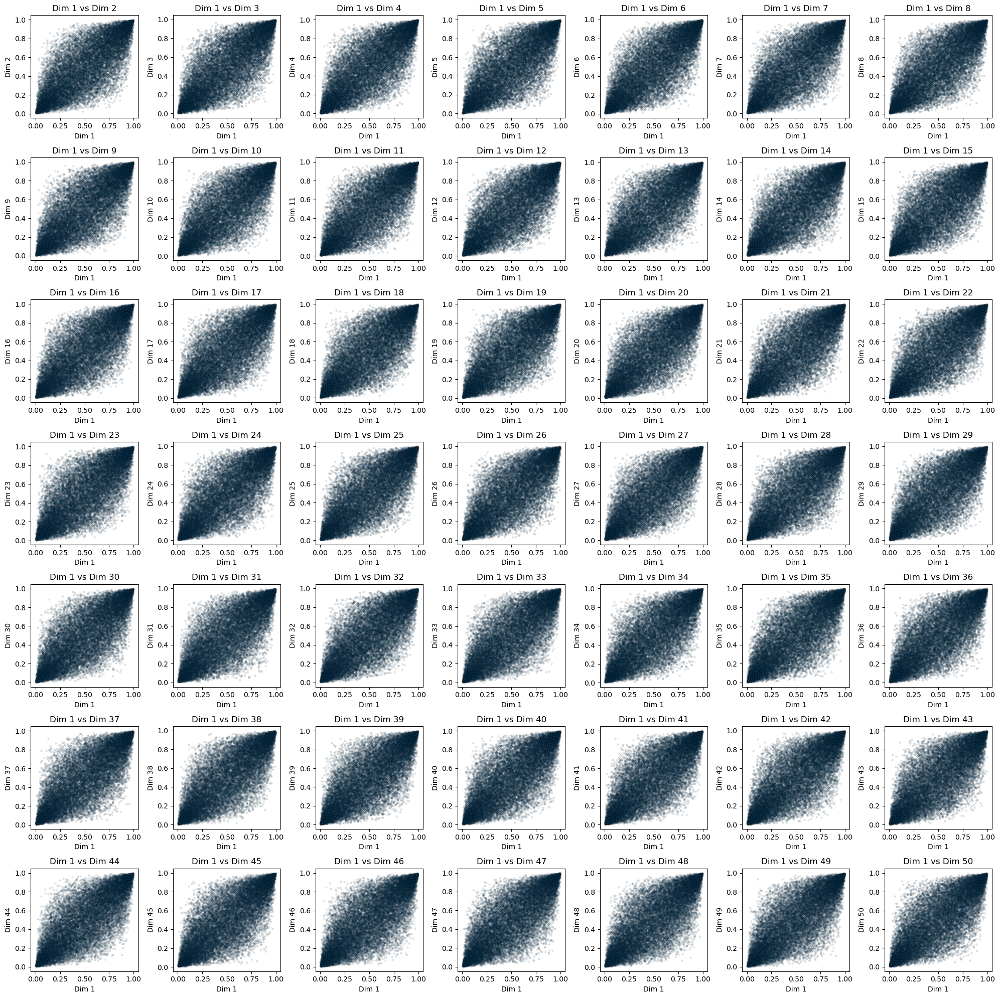

In [26]:
# plot pairs of the copula samples
# Number of dimensions to plot (excluding the first one)
num_plots = gaussian_diff50d.shape[1] - 1

# Create a grid of subplots (7 rows, 7 columns)
fig, axes = plt.subplots(7, 7, figsize=(20, 20))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each dimension against the first dimension (copula_samples[:, 0])
for i in range(1, num_plots+1):
    axes[i-1].scatter(gaussian_diff50d[:, 0], gaussian_diff50d[:, i], alpha=0.1,edgecolors='black',s=5)
    axes[i-1].set_title(f"Dim 1 vs Dim {i+1}")
    axes[i-1].set_xlabel("Dim 1")
    axes[i-1].set_ylabel(f"Dim {i+1}")

# Remove any unused subplots
for j in range(i, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for readability
plt.tight_layout()
plt.show()

In [27]:
# function to compute Best of Call 
def best_of_call(copula_samples,K=0.2):
    max_X=copula_samples.max(axis=1)
    payoff=np.maximum(max_X-K,0)
    return payoff.mean()

def VaR_S(copula_samples,level=0.99):
    S=np.mean(copula_samples,axis=1)
    return np.quantile(S,level)

def ES_S(copula_samples,level=0.99):
    S=np.mean(copula_samples,axis=1)
    ES=np.mean(S[S>=np.quantile(S,level)])
    return ES

# function to compute variability of risk measure
def var_risk_measure(risk_measure,diffusion_model,n_list=np.arange(10000,200000,dtype=int),dim=50,B=25,qmc=False,level=0.99,K=0.05):
    est_std_list=[]    
    est_mean_list=[]
      
    for i in n_list:
        risk_measure_temp=[]
        for b in range(B):
            if qmc:     
                new_sobol=torch.quasirandom.SobolEngine(dimension=dim,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0]),scramble=True).draw(i)
                new_sobol=torch.clamp(new_sobol, min=1e-5, max=1-1e-5)     
                new_gaussian=torch.Tensor(norm.ppf(new_sobol))
            else:
                new_gaussian=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(dim),torch.eye(dim)).sample(torch.Size([i]))
            
            # pass the Gaussian noise through the diffusion model to get pseudo copula samples  
            diffusion_model_samples=torch.clamp(diffusion_model.undo_noise(new_gaussian), min=1e-5, max=1-1e-5)
            # calculate risk measure
            if risk_measure==best_of_call:
                risk_measure_est=risk_measure(norm.ppf(diffusion_model_samples),K=K)
            else:
                risk_measure_est=risk_measure(norm.ppf(diffusion_model_samples),level=level)
            risk_measure_temp.append(risk_measure_est)
        # Calculate the mean absolute deviation and mean of the B estimates
        # print(risk_measure_temp)
        est_std_list.append(np.std(risk_measure_temp))
        est_mean_list.append(np.mean(risk_measure_temp))
            
    # Return variances and means for each n in n_list
    return np.array(n_list), np.array(est_std_list), np.array(est_mean_list)


In [28]:
# check whether generalizes to low discrepancy sequence

# instantiate Gaussian copula
gaussianCopula2d=copula.normalCopula(dim=2,p=0.8)

# initialize low discrepancy sequence in torch
ind_uniform_gaussian_sobol_samples2d=torch.clamp(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0]),scramble=True).draw(100000), min=1e-8, max=1-1e-8)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gaussian_sobol_samples_2d=norm.ppf(ind_uniform_gaussian_sobol_samples2d)
ind_gaussian_sobol_samples2d=torch.Tensor(ind_gaussian_sobol_samples_2d)

# convert the Sobol sequence to a r matrix
ind_uniform_gaussian_sobol_samples_r2d=r.matrix(ind_uniform_gaussian_sobol_samples2d.numpy(),nrow=ind_uniform_gaussian_sobol_samples2d.shape[0],ncol=ind_uniform_gaussian_sobol_samples2d.shape[1])

# convert U_ind to U'_dep with inverse Rosenblatt transform
uniform_gaussian_sobol_samples_r2d=copula.cCopula(ind_uniform_gaussian_sobol_samples_r2d,copula=gaussianCopula2d,inverse=True)
uniform_gaussian_sobol_samples2d=torch.clamp(torch.Tensor(uniform_gaussian_sobol_samples_r2d), min=1e-5, max=1-1e-5)

In [29]:
# Diffusion model for Gaussian

# initialize diffusion model with parameters
diffsobol2d=Diffusion(timesteps=10)
diffsobol2d.gen_beta_schedule()
diffsobol2d.calc_alpha()

# initialize neural network
mlp_gaussiansobol2d=MLP(dim_input=2,dim_output=2)

train_copula_samples(diffsobol2d,mlp_gaussiansobol2d,ind_gaussian_sobol_samples2d,uniform_gaussian_sobol_samples2d,epochs=500)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.13725429773330688
Epoch 1, Current Loss = 0.12561734020709991
Epoch 2, Current Loss = 0.11244860291481018
Epoch 3, Current Loss = 0.10000386834144592
Epoch 4, Current Loss = 0.08941512554883957
Epoch 5, Current Loss = 0.07822562009096146
Epoch 6, Current Loss = 0.06917199492454529
Epoch 7, Current Loss = 0.06056913360953331
Epoch 8, Current Loss = 0.05093561112880707
Epoch 9, Current Loss = 0.04523288831114769
Epoch 10, Current Loss = 0.03668113052845001
Epoch 11, Current Loss = 0.03108224645256996
Epoch 12, Current Loss = 0.025439709424972534
Epoch 13, Current Loss = 0.02556416764855385
Epoch 14, Current Loss = 0.018714847043156624
Epoch 15, Current Loss = 0.014075128361582756
Epoch 16, Current Loss = 0.011277593672275543
Epoch 17, Current Loss = 0.01406848430633545
Epoch 18, Current Loss = 0.011309253051877022
Epoch 19, Current Loss = 0.01008398737758398
Epoch 20, Current Loss = 0.006995877716690302
Epoch 21, Current Loss = 0.005299086682498455
Epoch 22, Cur

In [30]:
# to save our Neural network model
torch.save(mlp_gaussiansobol2d, 'mlp_gaussiansobol_MSE_2d.pth')

# Load the entire model
# mlp_gaussiansobol2d = torch.load('mlp_gaussiansobol_MSE_2d.pth')
# mlp_gaussiansobol2d.eval()  # Set the model to evaluation mode
# diffsobol2d.reverse_decoder=mlp_gaussiansobol2d

([<matplotlib.axis.YTick at 0x190914ce640>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

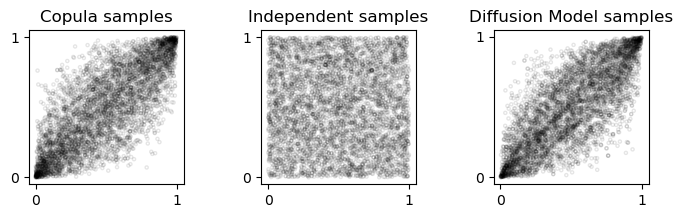

In [31]:
# randomly sample 200 samples from copula/independent samples to plot out the graphs
ind=torch.randint(low=0,high=60000,size=(5000,))

# dependent samples
x,y=np.array(uniform_gaussian_samples2d[ind,0]),np.array(uniform_gaussian_samples2d[ind,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1, edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_gaussian_samples2d[ind,0]),np.array(ind_uniform_gaussian_samples2d[ind,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent gaussian
new_gaussiansobol2d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
# pass the observed data through the reverse decoder to get pseudo copula samples
gaussian_diffsobol2d=diffsobol2d.undo_noise(new_gaussiansobol2d)
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
x,y=np.array(gaussian_diffsobol2d[ind_diff,0]),np.array(gaussian_diffsobol2d[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

Diffusion model MMD: 0.0529952347278595, Copula MMD: 0.044281601905822754, Diffusion Sobol MMD: 0.05418885126709938


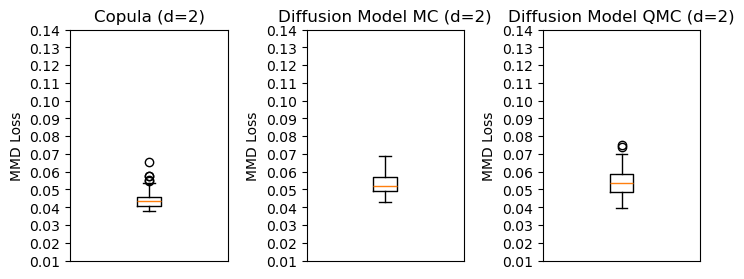

In [32]:
# calculate MMD for Copula and Diffusion Model
MMD_gaussian_copula2d=MMD_bootstrap(gaussianCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula2d))),B=100,batch_size=5000)
MMD_gaussian_diffusionsobol2d=MMD_bootstrap(gaussianCopula2d,gaussian_diffsobol2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gaussian_copula2d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion2d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gaussian_diffusionsobol2d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=2)")

print(f"Diffusion model MMD: {np.mean(MMD_gaussian_diffusion2d)}, Copula MMD: {np.mean(MMD_gaussian_copula2d)}, Diffusion Sobol MMD: {np.mean(MMD_gaussian_diffusionsobol2d)}")

In [33]:
# save the MMD results
np.save('MMD_gaussian_copula_2d.npy',MMD_gaussian_copula2d)
np.save('MMD_gaussian_diffusionsobol_2d.npy',MMD_gaussian_diffusionsobol2d)

# load the MMD results
# MMD_gaussian_copula2d=np.load('MMD_gaussian_copula_2d.npy')
# MMD_gaussian_diffusionsobol2d=np.load('MMD_gaussian_diffusionsobol_2d.npy')

In [34]:
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diffsobol2d,n_list=n_list,dim=2,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diffsobol2d,n_list=n_list,dim=2,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diffsobol2d,n_list=n_list,dim=2,qmc=True,level=0.95)

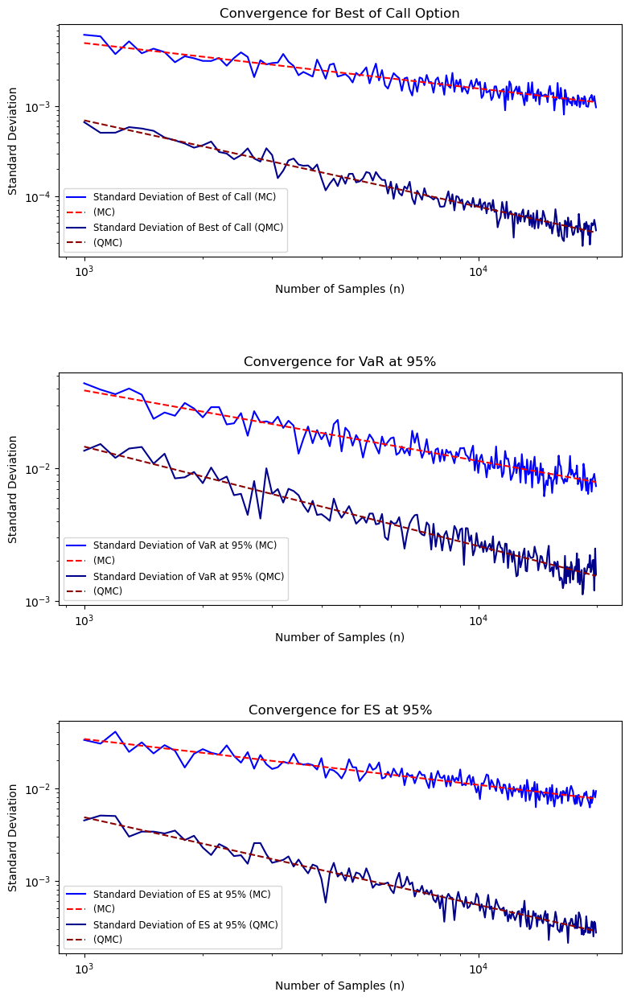

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.5064071998771112
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.9618938503767454
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5330531098753415
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.7519425625883881
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.4952454736839703
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.9467236234232024


In [35]:
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

Diffusion model MMD: 0.0529952347278595, Copula MMD: 0.04591638594865799, Diffusion Sobol MMD: 0.052474495023489


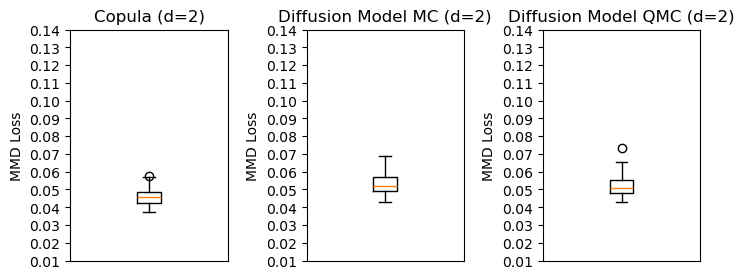

In [36]:
# calculate MMD for Copula and Diffusion Model trained with PRNG but generated with QMC
# generate new samples from neural network
# simulate independent gaussian
new_gaussiansobolmc2d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
gaussian_diffsobolmc2d=diff2d.undo_noise(new_gaussiansobolmc2d)

MMD_gaussian_copula2d=MMD_bootstrap(gaussianCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula2d))),B=100,batch_size=5000)
MMD_gaussian_diffusionsobolmc2d=MMD_bootstrap(gaussianCopula2d,gaussian_diffsobolmc2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gaussian_copula2d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion2d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gaussian_diffusionsobolmc2d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=2)")

print(f"Diffusion model MMD: {np.mean(MMD_gaussian_diffusion2d)}, Copula MMD: {np.mean(MMD_gaussian_copula2d)}, Diffusion Sobol MMD: {np.mean(MMD_gaussian_diffusionsobolmc2d)}")

In [37]:
# save the MMD results
np.save('MMD_gaussian_copula_2d.npy',MMD_gaussian_copula2d)
np.save('MMD_gaussian_diffusionsobolmc_2d.npy',MMD_gaussian_diffusionsobolmc2d)

# load the MMD results
# MMD_gaussian_copula2d=np.load('MMD_gaussian_copula_2d.npy')
# MMD_gaussian_diffusionsobol2d=np.load('MMD_gaussian_diffusionsobolmc_2d.npy')

In [38]:
# investigate whether the neural network trained with PRNG can retain QR properties

# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,qmc=True,level=0.95)

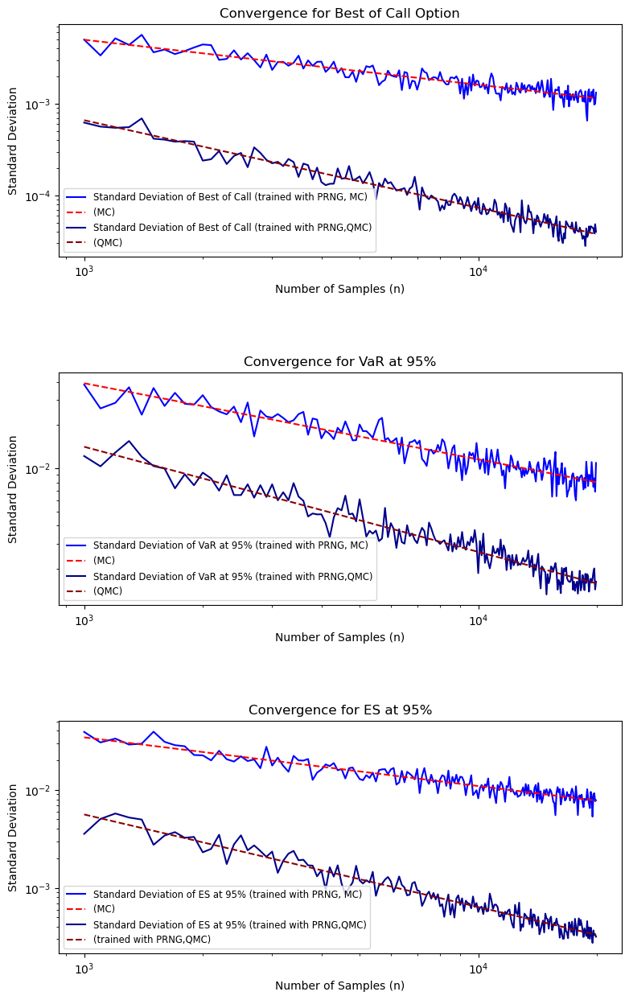

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.4909339560804093
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.9553608464912882
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5289424362111627
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.7302905524472836
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.4965294501767566
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.9442432977337282


In [39]:
# Graphs for Diffusion Model trained with PRNG but generating QMC samples

plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (trained with PRNG, MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (trained with PRNG,QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (trained with PRNG, MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (trained with PRNG,QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (trained with PRNG, MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (trained with PRNG,QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(trained with PRNG,QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

In [40]:
# check whether generalizes to low discrepancy sequence

# instantiate Gaussian copula
gaussianCopula50d=copula.normalCopula(dim=50,p=0.8)

# initialize low discrepancy sequence in torch
ind_uniform_gaussian_sobol_samples50d=torch.clamp(torch.quasirandom.SobolEngine(dimension=50,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0]),scramble=True).draw(200000), min=1e-5, max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gaussian_sobol_samples_50d=norm.ppf(ind_uniform_gaussian_sobol_samples50d)
ind_gaussian_sobol_samples50d=torch.Tensor(ind_gaussian_sobol_samples_50d)

# convert the Sobol sequence to a r matrix
ind_uniform_gaussian_sobol_samples_r50d=r.matrix(ind_uniform_gaussian_sobol_samples50d.numpy(),nrow=ind_uniform_gaussian_sobol_samples50d.shape[0],ncol=ind_uniform_gaussian_sobol_samples50d.shape[1])

# convert U_ind to U'_dep with inverse Rosenblatt transform
uniform_gaussian_sobol_samples_r50d=copula.cCopula(ind_uniform_gaussian_sobol_samples_r50d,copula=gaussianCopula50d,inverse=True)
uniform_gaussian_sobol_samples50d=torch.clamp(torch.Tensor(uniform_gaussian_sobol_samples_r50d), min=1e-5, max=1-1e-5)

In [41]:
# Diffusion model for Gaussian

# initialize diffusion model with parameters
diffsobol50d=Diffusion(timesteps=10)
diffsobol50d.gen_beta_schedule()
diffsobol50d.calc_alpha()

# initialize neural network
mlp_gaussiansobol50d=MLP(dim_input=50,dim_output=50)
train_copula_samples(diffsobol50d,mlp_gaussiansobol50d,ind_gaussian_sobol_samples50d,uniform_gaussian_sobol_samples50d,epochs=500,sampling_size=100000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.1006317138671875
Epoch 1, Current Loss = 0.09786300361156464
Epoch 2, Current Loss = 0.09520838409662247
Epoch 3, Current Loss = 0.09284447133541107
Epoch 4, Current Loss = 0.08995473384857178
Epoch 5, Current Loss = 0.08758346736431122
Epoch 6, Current Loss = 0.08550108969211578
Epoch 7, Current Loss = 0.08335287123918533
Epoch 8, Current Loss = 0.08042474836111069
Epoch 9, Current Loss = 0.07810118049383163
Epoch 10, Current Loss = 0.07492171972990036
Epoch 11, Current Loss = 0.07281775772571564
Epoch 12, Current Loss = 0.07063528150320053
Epoch 13, Current Loss = 0.06830847263336182
Epoch 14, Current Loss = 0.0657806247472763
Epoch 15, Current Loss = 0.06458751857280731
Epoch 16, Current Loss = 0.061526764184236526
Epoch 17, Current Loss = 0.060777824372053146
Epoch 18, Current Loss = 0.058453574776649475
Epoch 19, Current Loss = 0.05531907454133034
Epoch 20, Current Loss = 0.05331246182322502
Epoch 21, Current Loss = 0.05231756716966629
Epoch 22, Current L

In [42]:
# to save our Neural network model
torch.save(mlp_gaussiansobol50d, 'mlp_gaussiansobol_MSE_50d.pth')

# Load the entire model
# mlp_gaussiansobol50d = torch.load('mlp_gaussiansobol_MSE_50d.pth')
# mlp_gaussiansobol50d.eval()  # Set the model to evaluation mode
# diffsobol50d.reverse_decoder=mlp_gaussiansobol50d

Diffusion model MMD: 0.055222585797309875, Copula MMD: 0.05025475099682808, Diffusion Sobol MMD: 0.05504423752427101


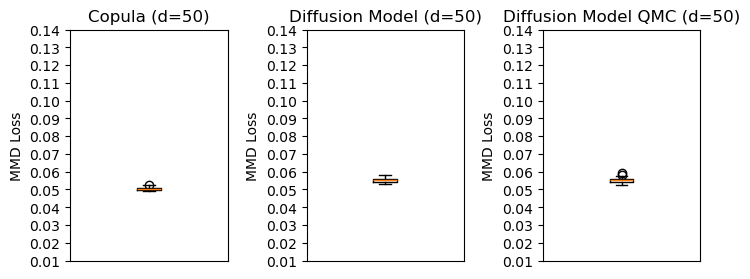

In [43]:
# generate new samples from neural network
# simulate independent gaussians
new_gaussiansobol50d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=50,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
# pass the observed data through the reverse decoder to get pseudo copula samples
gaussian_diffsobol50d=diff50d.undo_noise(new_gaussiansobol50d)

# calculate MMD for Copula and Diffusion Model
MMD_gaussian_copula50d=MMD_bootstrap(gaussianCopula50d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula50d))),B=100,batch_size=5000)
MMD_gaussian_diffusionsobol50d=MMD_bootstrap(gaussianCopula50d,gaussian_diffsobol50d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gaussian_copula50d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=50)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion50d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=50)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gaussian_diffusionsobol50d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=50)")
print(f"Diffusion model MMD: {np.mean(MMD_gaussian_diffusion50d)}, Copula MMD: {np.mean(MMD_gaussian_copula50d)}, Diffusion Sobol MMD: {np.mean(MMD_gaussian_diffusionsobol50d)}")

In [44]:
# save the MMD results
np.save('MMD_gaussian_copula_50d.npy',MMD_gaussian_copula50d)
np.save('MMD_gaussian_diffusionsobol_50d.npy',MMD_gaussian_diffusionsobol50d)

# load the MMD results
# MMD_gaussian_copula50d=np.load('MMD_gaussian_copula_50d.npy')
# MMD_gaussian_diffusionsobol50d=np.load('MMD_gaussian_diffusionsobol_50d.npy')

In [45]:
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff50d,n_list=n_list,dim=50,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diffsobol50d,n_list=n_list,dim=50,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diffsobol50d,n_list=n_list,dim=50,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diffsobol50d,n_list=n_list,dim=50,qmc=True,level=0.95)

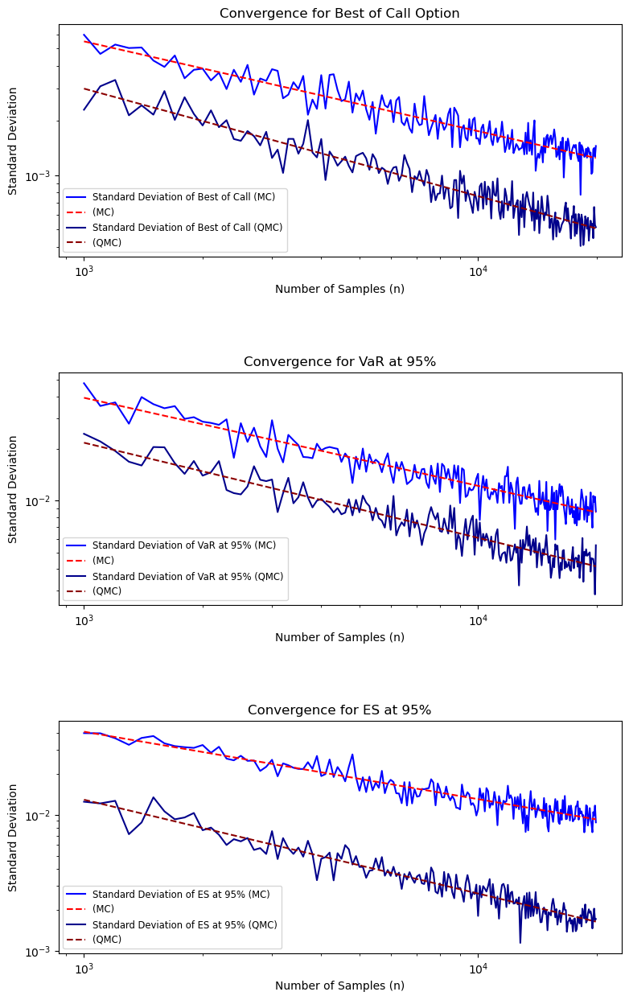

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.4964709336059414
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.5945470589527297
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5111018040423266
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.5519858740192239
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.4957116201571431
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.6896970002774011


In [46]:
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

Diffusion model MMD: 0.055222585797309875, Copula MMD: 0.04998459666967392, Diffusion Sobol MMD: 0.05518899857997894


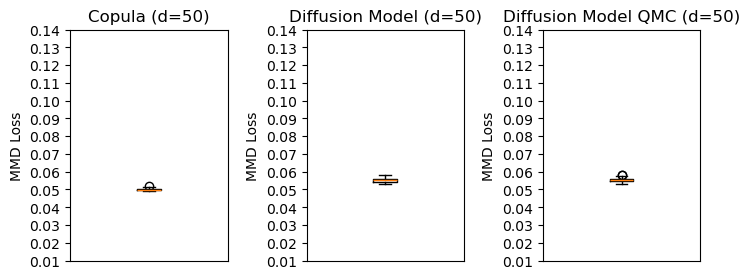

In [47]:
# MMD for Diffusion Model trained with PRNG but generated with QMC
# generate new samples from neural network
# simulate independent gaussians
new_gaussiansobolmc50d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=50,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
# pass the observed data through the reverse decoder to get pseudo copula samples
gaussian_diffsobolmc50d=diff50d.undo_noise(new_gaussiansobol50d)

# calculate MMD for Copula and Diffusion Model
MMD_gaussian_copula50d=MMD_bootstrap(gaussianCopula50d,torch.Tensor(np.array(copula.rCopula(20000,gaussianCopula50d))),B=100,batch_size=5000)
MMD_gaussian_diffusionsobolmc50d=MMD_bootstrap(gaussianCopula50d,gaussian_diffsobolmc50d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gaussian_copula50d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=50)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gaussian_diffusion50d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=50)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gaussian_diffusionsobolmc50d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=50)")
print(f"Diffusion model MMD: {np.mean(MMD_gaussian_diffusion50d)}, Copula MMD: {np.mean(MMD_gaussian_copula50d)}, Diffusion Sobol MMD: {np.mean(MMD_gaussian_diffusionsobolmc50d)}")

In [48]:
# save the MMD results
np.save('MMD_gaussian_copula_50d.npy',MMD_gaussian_copula50d)
np.save('MMD_gaussian_diffusionsobolmc_50d.npy',MMD_gaussian_diffusionsobolmc50d)

# load the MMD results
# MMD_gaussian_copula50d=np.load('MMD_gaussian_copula_50d.npy')
# MMD_gaussian_diffusionsobolmc50d=np.load('MMD_gaussian_diffusionsobolmc_50d.npy')

In [49]:
# investigate whether the neural network trained with PRNG can retain QR properties
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff50d,n_list=n_list,dim=50,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diff50d,n_list=n_list,dim=50,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diff50d,n_list=n_list,dim=50,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diff50d,n_list=n_list,dim=50,qmc=True,level=0.95)

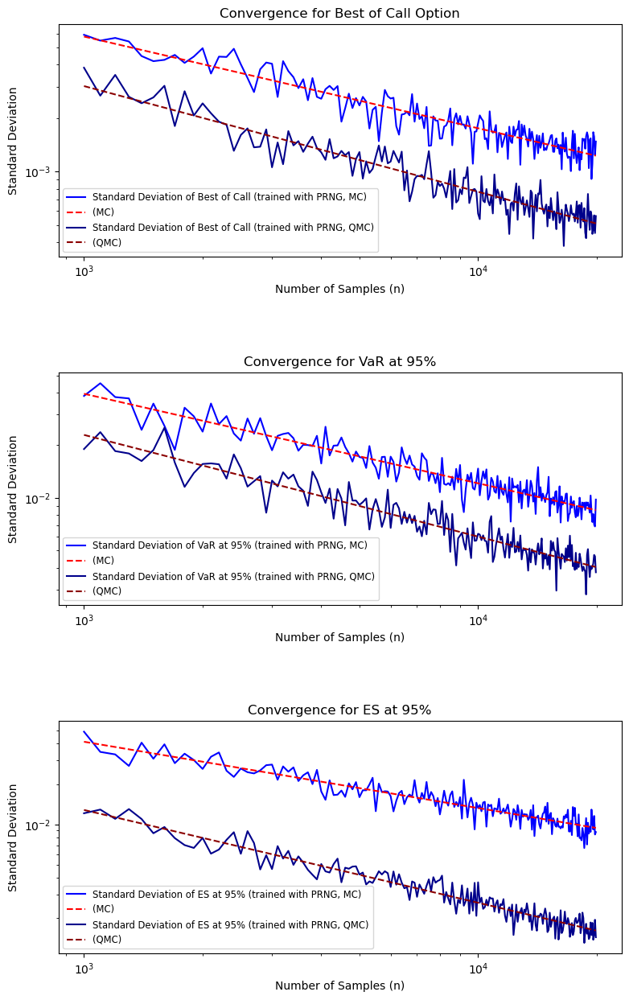

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.5164702708447173
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.5953277066411007
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5112239479022958
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.580906848194462
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.4943757506151994
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.691927389023202


In [50]:
# Graphs for Diffusion Model trained with PRNG but generating QMC samples
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (trained with PRNG, MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (trained with PRNG, QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (trained with PRNG, MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (trained with PRNG, QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (trained with PRNG, MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (trained with PRNG, QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

In [51]:
set_trace()

--Call--
> c:\users\user\anaconda3\envs\ml_win_old\lib\site-packages\ipython\core\displayhook.py(258)__call__()
    256         sys.stdout.flush()
    257 
--> 258     def __call__(self, result=None):
    259         """Printing with history cache management.
    260 



In [52]:
# Gumbel copula
# instantiate Gumbel copula
gumbelCopula2d=copula.gumbelCopula(dim=2,param=2)

# generate samples from Gumbel copula
uniform_gumbel_samples_r2d=copula.rCopula(60000,gumbelCopula2d)
uniform_gumbel_samples2d=torch.clamp(torch.Tensor(np.array(uniform_gumbel_samples_r2d)), min=1e-5, max=1-1e-5)

# convert the uniform, U_dep back to gaussian, X_dep
gumbel_samples2d=norm.ppf(uniform_gumbel_samples2d)
gumbel_samples2d=torch.Tensor(gumbel_samples2d)

# convert the U'_dep to U_ind through Rosenblatt transform
ind_uniform_gumbel_samples_r2d=copula.cCopula(u=uniform_gumbel_samples_r2d,copula=gumbelCopula2d)
ind_uniform_gumbel_samples2d=torch.clamp(torch.Tensor(np.array(ind_uniform_gumbel_samples_r2d)),min=1e-5,max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gumbel_samples2d=norm.ppf(ind_uniform_gumbel_samples2d)
ind_gumbel_samples2d=torch.Tensor(ind_gumbel_samples2d)

# Copula samples, U_dep -> Rosenblatt transform -> U_ind independent samples corresponding to copula samples-> Gaussian ppf-> normal margins

In [53]:
# Diffusion model for Gumbel

# initialize diffusion model with parameters
diff2d=Diffusion(timesteps=10)
diff2d.gen_beta_schedule()
diff2d.calc_alpha()

# initialize neural network
mlp_gumbel2d=MLP(dim_input=2,dim_output=2)

train_copula_samples(diff2d,mlp_gumbel2d,ind_gumbel_samples2d,uniform_gumbel_samples2d,epochs=300)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.10009349137544632
Epoch 1, Current Loss = 0.08940713852643967
Epoch 2, Current Loss = 0.08013875037431717
Epoch 3, Current Loss = 0.07044762372970581
Epoch 4, Current Loss = 0.06128118559718132
Epoch 5, Current Loss = 0.05414947122335434
Epoch 6, Current Loss = 0.04632358253002167
Epoch 7, Current Loss = 0.03945453464984894
Epoch 8, Current Loss = 0.03369206190109253
Epoch 9, Current Loss = 0.030500438064336777
Epoch 10, Current Loss = 0.02359933592379093
Epoch 11, Current Loss = 0.02445884607732296
Epoch 12, Current Loss = 0.01636841706931591
Epoch 13, Current Loss = 0.018180061131715775
Epoch 14, Current Loss = 0.013376443646848202
Epoch 15, Current Loss = 0.01048539113253355
Epoch 16, Current Loss = 0.008137393742799759
Epoch 17, Current Loss = 0.007632841821759939
Epoch 18, Current Loss = 0.008885388262569904
Epoch 19, Current Loss = 0.005665065720677376
Epoch 20, Current Loss = 0.005592147819697857
Epoch 21, Current Loss = 0.006893085781484842
Epoch 22, C

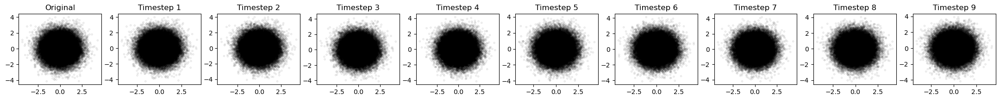

In [54]:
# plot out the original independent samples
plt.figure(figsize=(30, 2))
plt.subplot(1, 11, 1)
plt.scatter(ind_gumbel_samples2d[:,0],ind_gumbel_samples2d[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Original")

timesteps_to_plot=[1,2,3,4,5,6,7,8,9]
for idx,timestep in enumerate(timesteps_to_plot):
    # Run the unflattened image through the forward encoder
    eta=diff2d.sample_noise(ind_gumbel_samples2d.shape)
    corrupted_data=diff2d.forward_encoder(ind_gumbel_samples2d,timestep,eta)
    # Plot the corrupted image
    plt.subplot(1, 11, idx + 2)
    plt.scatter(corrupted_data[:,0],corrupted_data[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
    plt.title(f'Timestep {timestep}')

In [55]:
# set_trace()

In [56]:
# to save our Neural network model
torch.save(mlp_gumbel2d, 'mlp_gumbel_MSE2d.pth')

# Load the entire model
# mlp_gumbel2d = torch.load('mlp_gumbel_MSE2d.pth')
# mlp_gumbel2d.eval()  # Set the model to evaluation mode
# diff2d.reverse_decoder=mlp_gumbel2d

([<matplotlib.axis.YTick at 0x19084b4c730>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

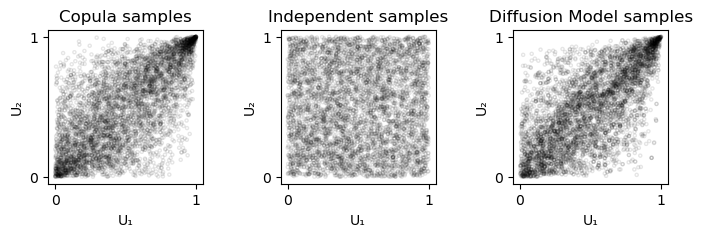

In [57]:
# randomly sample 6000 samples from copula/independent samples to plot out the graphs
ind=torch.randint(low=0,high=60000,size=(5000,))

# dependent samples
x,y=np.array(uniform_gumbel_samples2d[ind,0]),np.array(uniform_gumbel_samples2d[ind,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xlabel("U\N{SUBSCRIPT ONE}")
plt.ylabel("U\N{SUBSCRIPT TWO}")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_gumbel_samples2d[ind,0]),np.array(ind_uniform_gumbel_samples2d[ind,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xlabel("U\N{SUBSCRIPT ONE}")
plt.ylabel("U\N{SUBSCRIPT TWO}")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent gaussians
new_gumbel2d=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))
# pass the observed data through the reverse decoder to get pseudo copula samples
gumbel_diff2d=diff2d.undo_noise(new_gumbel2d)
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
x,y=np.array(gumbel_diff2d[ind_diff,0]),np.array(gumbel_diff2d[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xlabel("U\N{SUBSCRIPT ONE}")
plt.ylabel("U\N{SUBSCRIPT TWO}")
plt.xticks([0,1])
plt.yticks([0,1])

Copula MMD: 0.04532916843891144, Diffusion Model MMD: 0.06057502701878548


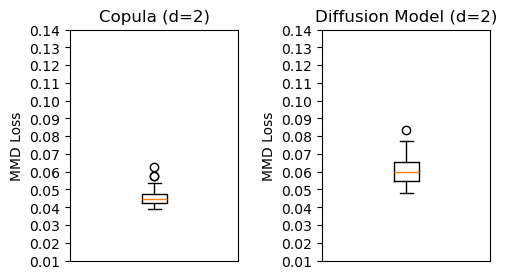

In [58]:
# calculate MMD for Copula and Diffusion Model
MMD_gumbel_copula2d=MMD_bootstrap(gumbelCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula2d))),B=100,batch_size=5000)
MMD_gumbel_diffusion2d=MMD_bootstrap(gumbelCopula2d,gumbel_diff2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_gumbel_copula2d
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion2d
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=2)")
print(f"Copula MMD: {np.mean(MMD_gumbel_copula2d)}, Diffusion Model MMD: {np.mean(MMD_gumbel_diffusion2d)}")

In [59]:
# save the MMD results
np.save('MMD_gumbel_copula2d.npy',MMD_gumbel_copula2d)
np.save('MMD_gumbel_diffusion2d.npy',MMD_gumbel_diffusion2d)

# load the MMD results
# MMD_gumbel_copula2d=np.load('MMD_gumbel_copula2d.npy')
# MMD_gumbel_diffusion2d=np.load('MMD_gumbel_diffusion2d.npy')

In [60]:
# check whether diffusion models can be trained with small number of samples - important for finance usages that have limited data
# Diffusion model for Gumbel
# sample from the previous copula samples
ind_small=torch.randint(low=0,high=60000,size=(5000,))

# initialize diffusion model with parameters
diff2dsmall=Diffusion(timesteps=10)
diff2dsmall.gen_beta_schedule()
diff2dsmall.calc_alpha()

# initialize neural network
mlp_gumbel2dsmall=MLP(dim_input=2,dim_output=2)

train_copula_samples(diff2dsmall,mlp_gumbel2dsmall,ind_gumbel_samples2d[ind_small,:],uniform_gumbel_samples2d[ind_small,:],epochs=2000,sampling_size=5000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.046674635261297226
Epoch 1, Current Loss = 0.03914783522486687
Epoch 2, Current Loss = 0.03304539620876312
Epoch 3, Current Loss = 0.027013292536139488
Epoch 4, Current Loss = 0.02469855733215809
Epoch 5, Current Loss = 0.01971372589468956
Epoch 6, Current Loss = 0.015820996835827827
Epoch 7, Current Loss = 0.012634740211069584
Epoch 8, Current Loss = 0.01693630963563919
Epoch 9, Current Loss = 0.008336980827152729
Epoch 10, Current Loss = 0.010288207791745663
Epoch 11, Current Loss = 0.013188610784709454
Epoch 12, Current Loss = 0.01063328143209219
Epoch 13, Current Loss = 0.004545675124973059
Epoch 14, Current Loss = 0.00612307945266366
Epoch 15, Current Loss = 0.005625823047012091
Epoch 16, Current Loss = 0.0026830036658793688
Epoch 17, Current Loss = 0.0023395344614982605
Epoch 18, Current Loss = 0.003688078373670578
Epoch 19, Current Loss = 0.006896449252963066
Epoch 20, Current Loss = 0.008462147787213326
Epoch 21, Current Loss = 0.005451412871479988
Epo

([<matplotlib.axis.YTick at 0x190800d3e80>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

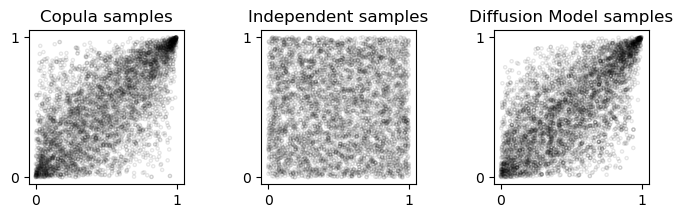

In [61]:
ind=torch.randint(low=0,high=60000,size=(5000,))
# dependent samples
x,y=np.array(uniform_gumbel_samples2d[ind,0]),np.array(uniform_gumbel_samples2d[ind,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1, edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_gumbel_samples2d[ind,0]),np.array(ind_uniform_gumbel_samples2d[ind,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent gaussians
new_gumbel2dsmall=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))
# pass the observed data through the reverse decoder to get pseudo copula samples
gumbel_diff2dsmall=diff2dsmall.undo_noise(new_gumbel2dsmall)
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
x,y=np.array(gumbel_diff2dsmall[ind_diff,0]),np.array(gumbel_diff2dsmall[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

In [62]:
# to save our Neural network model
# torch.save(mlp_gumbel2dsmall, 'mlp_gumbel_MSE2dsmall.pth')

# Load the entire model
mlp_gumbel2dsmall = torch.load('mlp_gumbel_MSE2dsmall.pth')
# mlp_gumbel2dsmall.eval()  # Set the model to evaluation mode
diff2dsmall.reverse_decoder=mlp_gumbel2dsmall

Copula MMD: 0.04453958198428154, Diffusion Model MMD: 0.051430102437734604


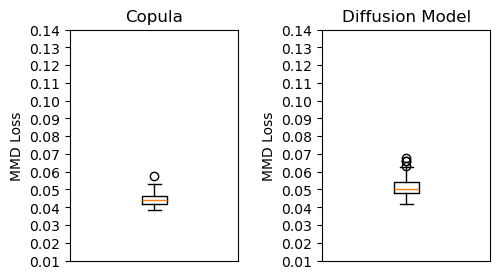

In [63]:
# generate new samples from neural network
# simulate independent gumbels
new_gumbel2dsmall=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))
# pass the observed data through the reverse decoder to get pseudo copula samples
gumbel_diff2dsmall=diff2dsmall.undo_noise(new_gumbel2dsmall)

# calculate MMD for Copula and Diffusion Model
MMD_gumbel_copula2dsmall=MMD_bootstrap(gumbelCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula2d))),B=100,batch_size=5000)
MMD_gumbel_diffusion2dsmall=MMD_bootstrap(gumbelCopula2d,gumbel_diff2dsmall,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_gumbel_copula2dsmall
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion2dsmall
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model")
print(f"Copula MMD: {np.mean(MMD_gumbel_copula2dsmall)}, Diffusion Model MMD: {np.mean(MMD_gumbel_diffusion2dsmall)}")

In [64]:
# save the MMD results
np.save('MMD_gumbel_copula2dsmall.npy',MMD_gumbel_copula2dsmall)
np.save('MMD_gumbel_diffusion2dsmall.npy',MMD_gumbel_diffusion2dsmall)
# load the MMD results
# MMD_gumbel_copula2dsmall=np.load('MMD_gumbel_copula2dsmall.npy')
# MMD_gumbel_diffusion2dsmall=np.load('MMD_gumbel_diffusion2dsmall.npy')

In [65]:
# scale to higher dimensions
# instantiate Gumbel copula
gumbelCopula50d=copula.gumbelCopula(dim=50,param=2)

# generate samples from Gumbel copula
uniform_gumbel_samples_r50d=copula.rCopula(200000,gumbelCopula50d)
uniform_gumbel_samples50d=torch.clamp(torch.Tensor(np.array(uniform_gumbel_samples_r50d)), min=1e-5, max=1-1e-5)

# convert the U'_dep to U_ind through Rosenblatt transform
ind_uniform_gumbel_samples_r50d=copula.cCopula(u=uniform_gumbel_samples_r50d,copula=gumbelCopula50d)
ind_uniform_gumbel_samples50d=torch.clamp(torch.Tensor(np.array(ind_uniform_gumbel_samples_r50d)), min=1e-5, max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gumbel_samples50d=norm.ppf(ind_uniform_gumbel_samples50d)
ind_gumbel_samples50d=torch.Tensor(ind_gumbel_samples50d)

In [66]:
# scale to higher dimensions
# Diffusion model for Gumbel
# initialize diffusion model with parameters
diff50d=Diffusion(timesteps=10)
diff50d.gen_beta_schedule()
diff50d.calc_alpha()

# initialize neural network
mlp_gumbel50d=MLP(dim_input=50,dim_output=50)

train_copula_samples(diff50d,mlp_gumbel50d,ind_gumbel_samples50d,uniform_gumbel_samples50d,epochs=1000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.10214368999004364
Epoch 1, Current Loss = 0.09954574704170227
Epoch 2, Current Loss = 0.09693093597888947
Epoch 3, Current Loss = 0.094259113073349
Epoch 4, Current Loss = 0.0917944684624672
Epoch 5, Current Loss = 0.0893963947892189
Epoch 6, Current Loss = 0.08696171641349792
Epoch 7, Current Loss = 0.08346859365701675
Epoch 8, Current Loss = 0.0821724608540535
Epoch 9, Current Loss = 0.07912211120128632
Epoch 10, Current Loss = 0.07667554914951324
Epoch 11, Current Loss = 0.07450170069932938
Epoch 12, Current Loss = 0.07245653867721558
Epoch 13, Current Loss = 0.07066666334867477
Epoch 14, Current Loss = 0.06804842501878738
Epoch 15, Current Loss = 0.06550686806440353
Epoch 16, Current Loss = 0.06333495676517487
Epoch 17, Current Loss = 0.06120739132165909
Epoch 18, Current Loss = 0.05977894738316536
Epoch 19, Current Loss = 0.057538118213415146
Epoch 20, Current Loss = 0.05532035231590271
Epoch 21, Current Loss = 0.05533597990870476
Epoch 22, Current Loss =

In [67]:
# to save our Neural network model
torch.save(mlp_gumbel50d, 'mlp_gumbel_MSE_50d.pth')

# Load the entire model
# mlp_gumbel50d = torch.load('mlp_gumbel_MSE_50d.pth')
# mlp_gumbel50d.eval()  # Set the model to evaluation mode
# diff50d.reverse_decoder=mlp_gumbel50d

Copula MMD: 0.05002894252538681, Diffusion Model MMD: 0.05718104913830757


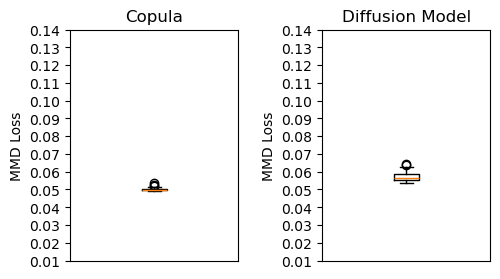

In [68]:
# generate new samples from neural network
# simulate independent gaussians
new_gumbel50d=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(50),torch.eye(50)).sample(torch.Size([20000]))
# pass the observed data through the reverse decoder to get pseudo copula samples
gumbel_diff50d=diff50d.undo_noise(new_gumbel50d)

# calculate MMD for Copula and Diffusion Model
MMD_gumbel_copula50d=MMD_bootstrap(gumbelCopula50d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula50d))),B=100,batch_size=5000)
MMD_gumbel_diffusion50d=MMD_bootstrap(gumbelCopula50d,gumbel_diff50d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_gumbel_copula50d
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
# plt.ylim(0.009, 0.151)
plt.title("Copula")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion50d
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
# plt.ylim(0.009, 0.181)
plt.title("Diffusion Model")
print(f"Copula MMD: {np.mean(MMD_gumbel_copula50d)}, Diffusion Model MMD: {np.mean(MMD_gumbel_diffusion50d)}")

In [69]:
# save the MMD results
np.save('MMD_gumbel_copula_50d.npy',MMD_gumbel_copula50d)
np.save('MMD_gumbel_diffusion_50d.npy',MMD_gumbel_diffusion50d)
# load the MMD results
# MMD_gumbel_copula50d=np.load('MMD_gumbel_copula_50d.npy')
# MMD_gumbel_diffusion50d=np.load('MMD_gumbel_diffusion_50d.npy')

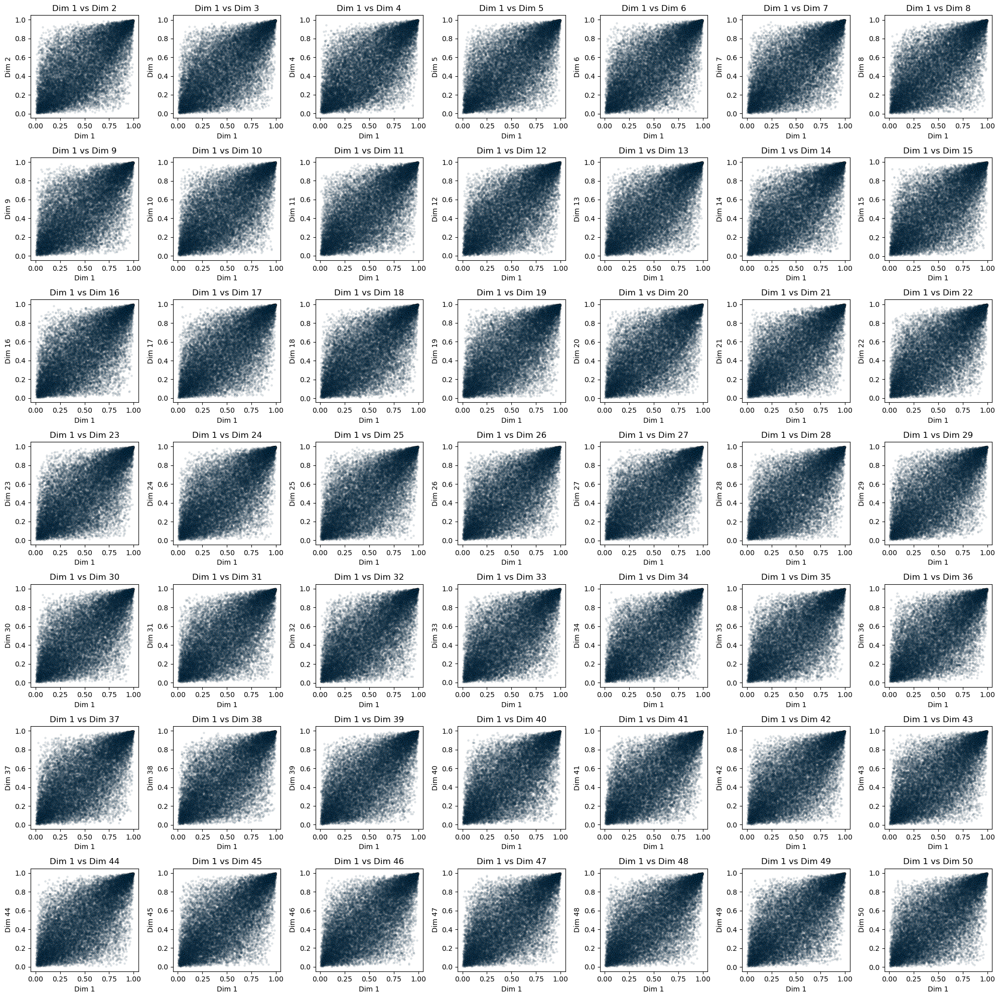

In [70]:
# plot pairs of the copula samples
# Number of dimensions to plot (excluding the first one)
num_plots = gumbel_diff50d.shape[1] - 1

# Create a grid of subplots (7 rows, 7 columns)
fig, axes = plt.subplots(7, 7, figsize=(20, 20))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each dimension against the first dimension (copula_samples[:, 0])
for i in range(1, num_plots+1):
    axes[i-1].scatter(gumbel_diff50d[:, 0], gumbel_diff50d[:, i], alpha=0.1,edgecolors='black',s=5)
    axes[i-1].set_title(f"Dim 1 vs Dim {i+1}")
    axes[i-1].set_xlabel("Dim 1")
    axes[i-1].set_ylabel(f"Dim {i+1}")

# Remove any unused subplots
for j in range(i, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for readability
plt.tight_layout()
plt.show()

In [71]:
# check whether generalizes to low discrepancy sequence

# instantiate Gumbel copula
gumbelCopula2d=copula.normalCopula(dim=2,p=0.8)

# initialize low discrepancy sequence in torch
ind_uniform_gumbel_sobol_samples2d=torch.clamp(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0]),scramble=True).draw(100000), min=1e-5, max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gumbel (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gumbel_sobol_samples_2d=norm.ppf(ind_uniform_gumbel_sobol_samples2d)
ind_gumbel_sobol_samples2d=torch.Tensor(ind_gumbel_sobol_samples_2d)

# convert the Sobol sequence to a r matrix
ind_uniform_gumbel_sobol_samples_r2d=r.matrix(ind_uniform_gumbel_sobol_samples2d.numpy(),nrow=ind_uniform_gumbel_sobol_samples2d.shape[0],ncol=ind_uniform_gumbel_sobol_samples2d.shape[1])

# convert U_ind to U'_dep with inverse Rosenblatt transform
uniform_gumbel_sobol_samples_r2d=copula.cCopula(ind_uniform_gumbel_sobol_samples_r2d,copula=gumbelCopula2d,inverse=True)
uniform_gumbel_sobol_samples2d=torch.clamp(torch.Tensor(uniform_gumbel_sobol_samples_r2d), min=1e-5, max=1-1e-5)

In [72]:
# Diffusion model for Gumbel

# initialize diffusion model with parameters
diffsobol2d=Diffusion(timesteps=10)
diffsobol2d.gen_beta_schedule()
diffsobol2d.calc_alpha()

# initialize neural network
mlp_gumbelsobol2d=MLP(dim_input=2,dim_output=2)

train_copula_samples(diffsobol2d,mlp_gumbelsobol2d,ind_gumbel_sobol_samples2d,uniform_gumbel_sobol_samples2d,epochs=500)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.03578551486134529
Epoch 1, Current Loss = 0.030953867360949516
Epoch 2, Current Loss = 0.024416182190179825
Epoch 3, Current Loss = 0.01941145397722721
Epoch 4, Current Loss = 0.019967809319496155
Epoch 5, Current Loss = 0.0126959765329957
Epoch 6, Current Loss = 0.010874898172914982
Epoch 7, Current Loss = 0.011122599244117737
Epoch 8, Current Loss = 0.010533525608479977
Epoch 9, Current Loss = 0.009416855871677399
Epoch 10, Current Loss = 0.0111598651856184
Epoch 11, Current Loss = 0.004801043309271336
Epoch 12, Current Loss = 0.005984916817396879
Epoch 13, Current Loss = 0.005613389890640974
Epoch 14, Current Loss = 0.0013539270730689168
Epoch 15, Current Loss = 0.004981167148798704
Epoch 16, Current Loss = 0.0008225592318922281
Epoch 17, Current Loss = 0.0012466327752918005
Epoch 18, Current Loss = 0.007559543009847403
Epoch 19, Current Loss = 0.000450674764579162
Epoch 20, Current Loss = 0.003476268844678998
Epoch 21, Current Loss = 0.0024445760063827038


In [73]:
# to save our Neural network model
torch.save(mlp_gumbelsobol2d, 'mlp_gumbelsobol_MSE_2d.pth')

# Load the entire model
# mlp_gumbelsobol2d = torch.load('mlp_gumbelsobol_MSE_2d.pth')
# mlp_gumbelsobol2d.eval()  # Set the model to evaluation mode
# diffsobol2d.reverse_decoder=mlp_gumbelsobol2d

Diffusion model MMD: 0.06057502701878548, Copula MMD: 0.04454326257109642, Diffusion Sobol MMD: 0.05083736777305603


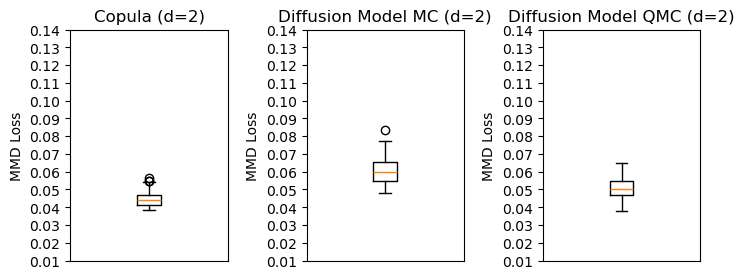

In [74]:
# generate new samples from neural network
# simulate independent gumbel
new_gumbelsobol2d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
gumbel_diffsobol2d=diffsobol2d.undo_noise(new_gumbelsobol2d)

# calculate MMD for Copula and Diffusion Model
MMD_gumbel_copula2d=MMD_bootstrap(gumbelCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula2d))),B=100,batch_size=5000)
MMD_gumbel_diffusionsobol2d=MMD_bootstrap(gumbelCopula2d,gumbel_diffsobol2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gumbel_copula2d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion2d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gumbel_diffusionsobol2d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=2)")
print(f"Diffusion model MMD: {np.mean(MMD_gumbel_diffusion2d)}, Copula MMD: {np.mean(MMD_gumbel_copula2d)}, Diffusion Sobol MMD: {np.mean(MMD_gumbel_diffusionsobol2d)}")

In [75]:
# save the MMD results
np.save('MMD_gumbel_copula_2d.npy',MMD_gumbel_copula2d)
np.save('MMD_gumbel_diffusionsobol_2d.npy',MMD_gumbel_diffusionsobol2d)

# load the MMD results
# MMD_gumbel_copula2d=np.load('MMD_gumbel_copula_2d.npy')
# MMD_gumbel_diffusionsobol2d=np.load('MMD_gumbel_diffusionsobol_2d.npy')

In [76]:
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diffsobol2d,n_list=n_list,dim=2,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diffsobol2d,n_list=n_list,dim=2,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diffsobol2d,n_list=n_list,dim=2,qmc=True,level=0.95)

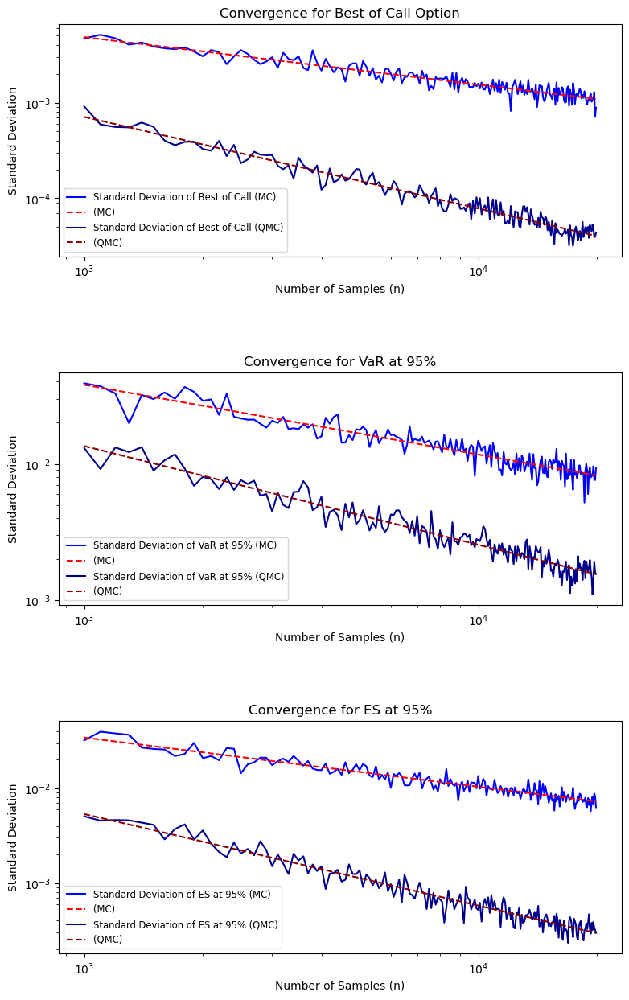

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.4970671316408343
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.9572190155544457
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5101102398869868
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.7231591439508873
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.5191112811573939
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.9664478950126416


In [77]:
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

Diffusion model MMD: 0.06057502701878548, Copula MMD: 0.04515022411942482, Diffusion Sobol MMD: 0.0841197520494461


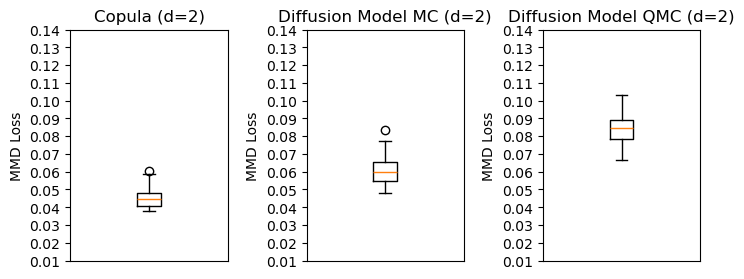

In [78]:
# calculate MMD for Copula and Diffusion Model trained with PRNG but generated with QMC
# generate new samples from neural network
# simulate independent gumbel
new_gumbelsobolmc2d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
gumbel_diffsobolmc2d=diff2d.undo_noise(new_gumbelsobolmc2d)

MMD_gumbel_copula2d=MMD_bootstrap(gumbelCopula2d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula2d))),B=100,batch_size=5000)
MMD_gumbel_diffusionsobolmc2d=MMD_bootstrap(gumbelCopula2d,gumbel_diffsobolmc2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gumbel_copula2d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion2d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gumbel_diffusionsobolmc2d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=2)")

print(f"Diffusion model MMD: {np.mean(MMD_gumbel_diffusion2d)}, Copula MMD: {np.mean(MMD_gumbel_copula2d)}, Diffusion Sobol MMD: {np.mean(MMD_gumbel_diffusionsobolmc2d)}")

In [79]:
# save the MMD results
np.save('MMD_gumbel_copula_2d.npy',MMD_gumbel_copula2d)
np.save('MMD_gumbel_diffusionsobolmc_2d.npy',MMD_gumbel_diffusionsobolmc2d)

# load the MMD results
# MMD_gumbel_copula2d=np.load('MMD_gumbel_copula_2d.npy')
# MMD_gumbel_diffusionsobol2d=np.load('MMD_gumbel_diffusionsobolmc_2d.npy')

In [80]:
# investigate whether the neural network trained with PRNG can retain QR properties

# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,qmc=True,level=0.95)

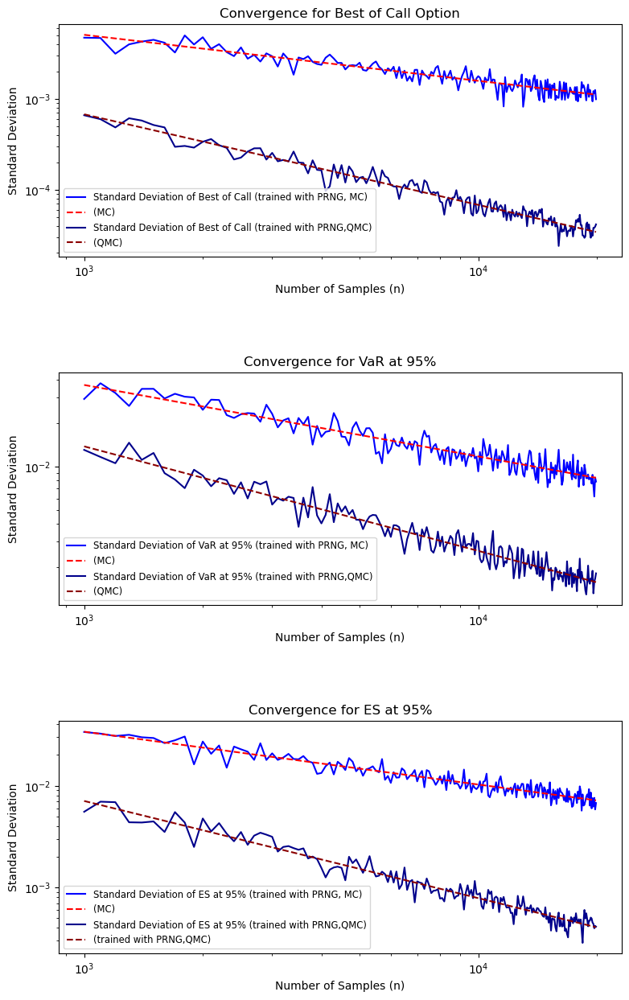

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.5074611899671171
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.9983548278561404
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.4953900726327837
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.7243597370338736
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.5190290897230433
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.9546257047179247


In [81]:
# Graphs for Diffusion Model trained with PRNG but generating QMC samples

plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (trained with PRNG, MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (trained with PRNG,QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (trained with PRNG, MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (trained with PRNG,QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (trained with PRNG, MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (trained with PRNG,QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(trained with PRNG,QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

In [82]:
# check whether generalizes to low discrepancy sequence

# instantiate gumbel copula
gumbelCopula50d=copula.normalCopula(dim=50,p=0.8)

# initialize low discrepancy sequence in torch
ind_uniform_gumbel_sobol_samples50d=torch.clamp(torch.quasirandom.SobolEngine(dimension=50,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0]),scramble=True).draw(200000), min=1e-5, max=1-1e-5)

# transform the uniform, U_ind with quantile function of gumbel (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_gumbel_sobol_samples_50d=norm.ppf(ind_uniform_gumbel_sobol_samples50d)
ind_gumbel_sobol_samples50d=torch.Tensor(ind_gumbel_sobol_samples_50d)

# convert the Sobol sequence to a r matrix
ind_uniform_gumbel_sobol_samples_r50d=r.matrix(ind_uniform_gumbel_sobol_samples50d.numpy(),nrow=ind_uniform_gumbel_sobol_samples50d.shape[0],ncol=ind_uniform_gumbel_sobol_samples50d.shape[1])

# convert U_ind to U'_dep with inverse Rosenblatt transform
uniform_gumbel_sobol_samples_r50d=copula.cCopula(ind_uniform_gumbel_sobol_samples_r50d,copula=gumbelCopula50d,inverse=True)
uniform_gumbel_sobol_samples50d=torch.clamp(torch.Tensor(uniform_gumbel_sobol_samples_r50d), min=1e-5, max=1-1e-5)

In [83]:
# Diffusion model for Gumbel

# initialize diffusion model with parameters
diffsobol50d=Diffusion(timesteps=10)
diffsobol50d.gen_beta_schedule()
diffsobol50d.calc_alpha()

# initialize neural network
mlp_gumbelsobol50d=MLP(dim_input=50,dim_output=50)

train_copula_samples(diffsobol50d,mlp_gumbelsobol50d,ind_gumbel_sobol_samples50d,uniform_gumbel_sobol_samples50d,epochs=1000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.10096463561058044
Epoch 1, Current Loss = 0.09833744913339615
Epoch 2, Current Loss = 0.09580811113119125
Epoch 3, Current Loss = 0.09310033172369003
Epoch 4, Current Loss = 0.09083795547485352
Epoch 5, Current Loss = 0.08830415457487106
Epoch 6, Current Loss = 0.08560959249734879
Epoch 7, Current Loss = 0.08398275077342987
Epoch 8, Current Loss = 0.08093952387571335
Epoch 9, Current Loss = 0.07857657223939896
Epoch 10, Current Loss = 0.07584942877292633
Epoch 11, Current Loss = 0.07436887919902802
Epoch 12, Current Loss = 0.07182960212230682
Epoch 13, Current Loss = 0.06894479691982269
Epoch 14, Current Loss = 0.06799300014972687
Epoch 15, Current Loss = 0.06516724824905396
Epoch 16, Current Loss = 0.06257650256156921
Epoch 17, Current Loss = 0.06045576557517052
Epoch 18, Current Loss = 0.058409515768289566
Epoch 19, Current Loss = 0.05749392881989479
Epoch 20, Current Loss = 0.056329187005758286
Epoch 21, Current Loss = 0.05422019958496094
Epoch 22, Current 

In [84]:
# to save our Neural network model
torch.save(mlp_gumbelsobol50d, 'mlp_gumbelsobol_MSE_50d.pth')

# Load the entire model
# mlp_gumbelsobol50d = torch.load('mlp_gumbelsobol_MSE_50d.pth')
# mlp_gumbelsobol50d.eval()  # Set the model to evaluation mode
# diffsobol50d.reverse_decoder=mlp_gumbelsobol50d

Diffusion model MMD: 0.05718104913830757, Copula MMD: 0.05010078847408295, Diffusion Sobol MMD: 0.09371348470449448


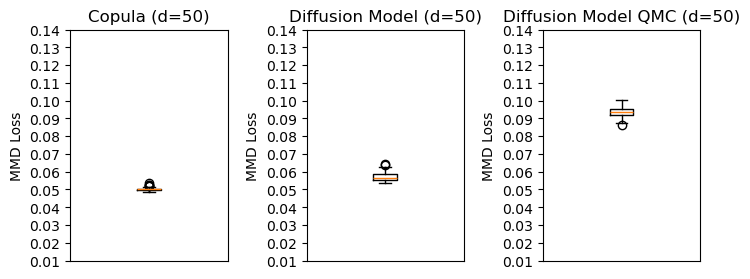

In [85]:
# generate new samples from neural network
# simulate independent gumbels
new_gumbelsobol50d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=50,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
# pass the observed data through the reverse decoder to get pseudo copula samples
gumbel_diffsobol50d=diff50d.undo_noise(new_gumbelsobol50d)

# calculate MMD for Copula and Diffusion Model
MMD_gumbel_copula50d=MMD_bootstrap(gumbelCopula50d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula50d))),B=100,batch_size=5000)
MMD_gumbel_diffusionsobol50d=MMD_bootstrap(gumbelCopula50d,gumbel_diffsobol50d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gumbel_copula50d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=50)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion50d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=50)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gumbel_diffusionsobol50d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=50)")
print(f"Diffusion model MMD: {np.mean(MMD_gumbel_diffusion50d)}, Copula MMD: {np.mean(MMD_gumbel_copula50d)}, Diffusion Sobol MMD: {np.mean(MMD_gumbel_diffusionsobol50d)}")

In [86]:
# save the MMD results
np.save('MMD_gumbel_copula_50d.npy',MMD_gumbel_copula50d)
np.save('MMD_gumbel_diffusionsobol_50d.npy',MMD_gumbel_diffusionsobol50d)

# load the MMD results
# MMD_gumbel_copula50d=np.load('MMD_gumbel_copula_50d.npy')
# MMD_gumbel_diffusionsobol50d=np.load('MMD_gumbel_diffusionsobol_50d.npy')

In [87]:
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff50d,n_list=n_list,dim=50,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diffsobol50d,n_list=n_list,dim=50,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diffsobol50d,n_list=n_list,dim=50,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diffsobol50d,n_list=n_list,dim=50,qmc=True,level=0.95)


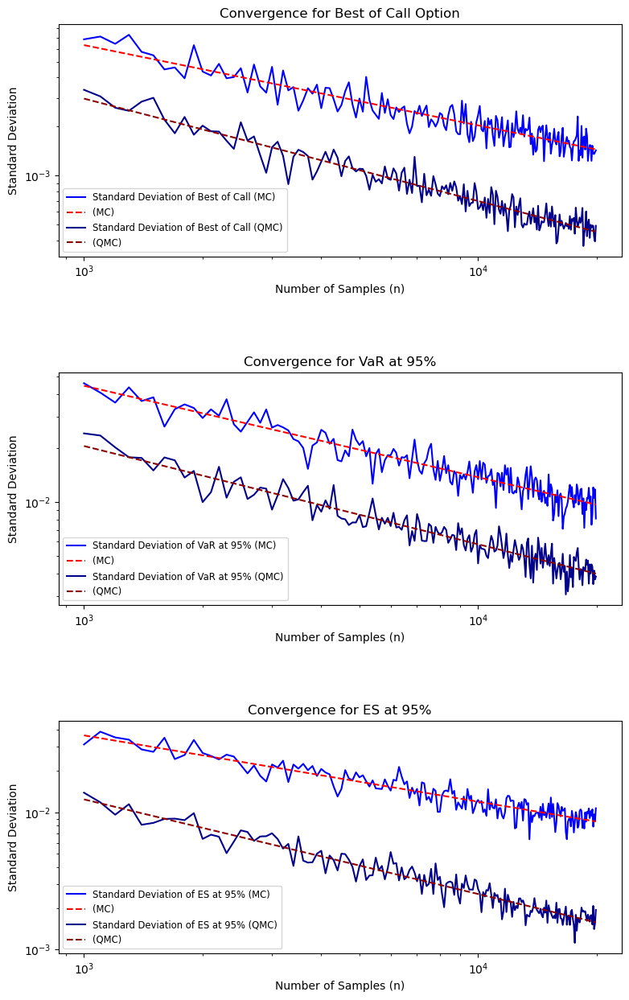

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.4925128766554107
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.6285278008880636
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5097846914276901
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.5477143933090645
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.48296465012747103
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.6893842638834047


In [88]:
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

Diffusion model MMD: 0.05718104913830757, Copula MMD: 0.04990105330944061, Diffusion Sobol MMD: 0.0930984616279602


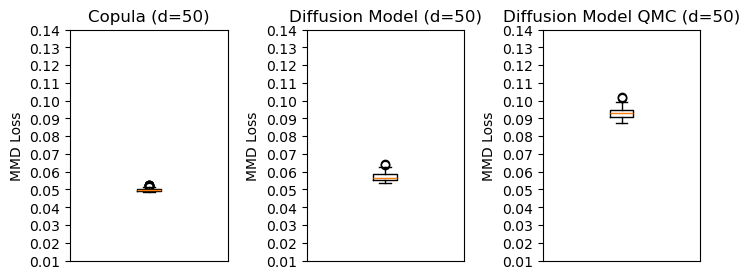

In [89]:
# generate new samples from neural network
# simulate independent gumbels
new_gumbelsobolmc50d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=50,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
# pass the observed data through the reverse decoder to get pseudo copula samples
gumbel_diffsobolmc50d=diff50d.undo_noise(new_gumbelsobol50d)

# calculate MMD for Copula and Diffusion Model
MMD_gumbel_copula50d=MMD_bootstrap(gumbelCopula50d,torch.Tensor(np.array(copula.rCopula(20000,gumbelCopula50d))),B=100,batch_size=5000)
MMD_gumbel_diffusionsobolmc50d=MMD_bootstrap(gumbelCopula50d,gumbel_diffsobolmc50d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_gumbel_copula50d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=50)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_gumbel_diffusion50d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=50)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_gumbel_diffusionsobolmc50d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=50)")
print(f"Diffusion model MMD: {np.mean(MMD_gumbel_diffusion50d)}, Copula MMD: {np.mean(MMD_gumbel_copula50d)}, Diffusion Sobol MMD: {np.mean(MMD_gumbel_diffusionsobolmc50d)}")

In [90]:
# save the MMD results
np.save('MMD_gumbel_copula_50d.npy',MMD_gumbel_copula50d)
np.save('MMD_gumbel_diffusionsobolmc_50d.npy',MMD_gumbel_diffusionsobolmc50d)

# load the MMD results
# MMD_gumbel_copula50d=np.load('MMD_gumbel_copula_50d.npy')
# MMD_gumbel_diffusionsobolmc50d=np.load('MMD_gumbel_diffusionsobolmc_50d.npy')

In [91]:
# investigate whether the neural network trained with PRNG can retain QR properties
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff50d,n_list=n_list,dim=50,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diff50d,n_list=n_list,dim=50,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diff50d,n_list=n_list,dim=50,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff50d,n_list=n_list,dim=50,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diff50d,n_list=n_list,dim=50,qmc=True,level=0.95)

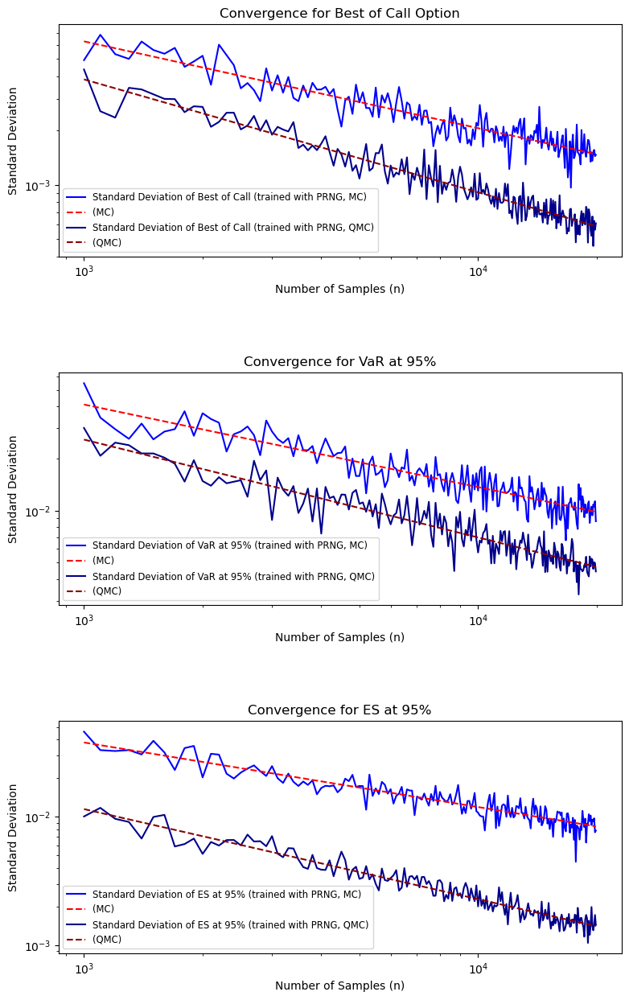

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.48192063625427306
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.626900412281966
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.4789645635271552
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.5674284619837326
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.5022931988135841
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.7010833218700397


In [92]:
# Graphs for Diffusion Model trained with PRNG but generating QMC samples
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (trained with PRNG, MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (trained with PRNG, QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (trained with PRNG, MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (trained with PRNG, QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (trained with PRNG, MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (trained with PRNG, QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

In [93]:
set_trace()

--Call--
> c:\users\user\anaconda3\envs\ml_win_old\lib\site-packages\ipython\core\displayhook.py(258)__call__()
    256         sys.stdout.flush()
    257 
--> 258     def __call__(self, result=None):
    259         """Printing with history cache management.
    260 



In [94]:
# instantiate Marshall-Olkin copula
moCopula2d=copula.moCopula(dim=2,param=robjects.FloatVector([0.2,0.7]))

# generate samples from Gaussian copula
uniform_mo_samples_r2d=copula.rCopula(100000,moCopula2d)
uniform_mo_samples2d=torch.clamp(torch.Tensor(np.array(uniform_mo_samples_r2d)),min=1e-5,max=1-1e-5)

# convert the U'_dep to U_ind through Rosenblatt transform
ind_uniform_mo_samples_r2d=copula.cCopula(u=uniform_mo_samples_r2d,copula=moCopula2d)
ind_uniform_mo_samples2d=torch.clamp(torch.Tensor(np.array(ind_uniform_mo_samples_r2d)),min=1e-5,max=1-1e-5)

# transform the uniform, U_ind with quantile function of Gaussian (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_mo_samples2d=norm.ppf(ind_uniform_mo_samples2d)
ind_mo_samples2d=torch.Tensor(ind_mo_samples2d)

# Copula samples, U_dep -> Rosenblatt transform -> U_ind independent samples corresponding to copula samples-> Gaussian ppf-> normal margins

In [95]:
# Diffusion model for Marshall-Olkin

# initialize diffusion model with parameters
diff2d=Diffusion(timesteps=10)
diff2d.gen_beta_schedule()
diff2d.calc_alpha()

# initialize neural network
mlp_mo2d=MLP(dim_input=2,dim_output=2)

train_copula_samples(diff2d,mlp_mo2d,ind_mo_samples2d,uniform_mo_samples2d,epochs=1000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.07513322681188583
Epoch 1, Current Loss = 0.0654284656047821
Epoch 2, Current Loss = 0.05886940658092499
Epoch 3, Current Loss = 0.05179104954004288
Epoch 4, Current Loss = 0.042385950684547424
Epoch 5, Current Loss = 0.03613828867673874
Epoch 6, Current Loss = 0.03319017216563225
Epoch 7, Current Loss = 0.027268491685390472
Epoch 8, Current Loss = 0.021607276052236557
Epoch 9, Current Loss = 0.019788069650530815
Epoch 10, Current Loss = 0.01692858338356018
Epoch 11, Current Loss = 0.016301536932587624
Epoch 12, Current Loss = 0.015496360138058662
Epoch 13, Current Loss = 0.009820801205933094
Epoch 14, Current Loss = 0.008044934831559658
Epoch 15, Current Loss = 0.008884644135832787
Epoch 16, Current Loss = 0.005876460112631321
Epoch 17, Current Loss = 0.0066482084803283215
Epoch 18, Current Loss = 0.005439687054604292
Epoch 19, Current Loss = 0.011789166368544102
Epoch 20, Current Loss = 0.0037257522344589233
Epoch 21, Current Loss = 0.005982780363410711
Epoc

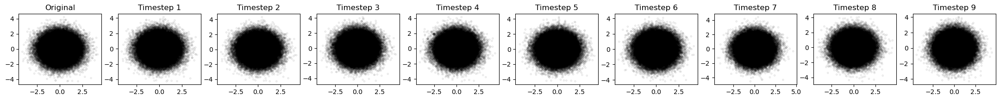

In [96]:
# plot out the original independent samples
plt.figure(figsize=(30, 2))
plt.subplot(1, 11, 1)
plt.scatter(ind_mo_samples2d[:,0],ind_mo_samples2d[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Original")

# plot out the corrupted samples
timesteps_to_plot=[1,2,3,4,5,6,7,8,9]
for idx,timestep in enumerate(timesteps_to_plot):
    # Run the unflattened image through the forward encoder
    eta=diff2d.sample_noise(ind_mo_samples2d.shape)
    corrupted_data=diff2d.forward_encoder(ind_mo_samples2d,timestep,eta)
    # Plot the corrupted independent data
    plt.subplot(1, 11, idx + 2)
    plt.scatter(corrupted_data[:,0],corrupted_data[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
    plt.title(f'Timestep {timestep}')

In [97]:
# to save our Neural network model
torch.save(mlp_mo2d, 'mlp_mo_MSE2d.pth')

# Load the entire model
# mlp_mo = torch.load('mlp_mo_MSE2d.pth')
# mlp_mo2d.eval()  # Set the model to evaluation mode
# diff2d.reverse_decoder=mlp_mo2d

([<matplotlib.axis.YTick at 0x190801f7760>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

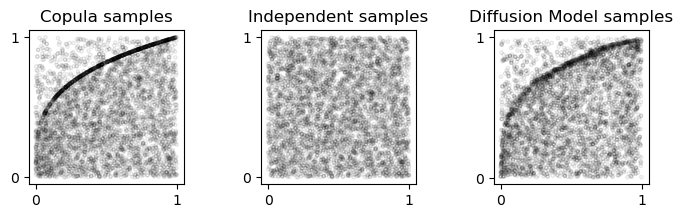

In [98]:
# randomly sample 20000 samples from copula/independent samples to plot out the graphs
ind=torch.randint(low=0,high=60000,size=(5000,))

# dependent samples
x,y=np.array(uniform_mo_samples2d[ind,0]),np.array(uniform_mo_samples2d[ind,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1, edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_mo_samples2d[ind,0]),np.array(ind_uniform_mo_samples2d[ind,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent mos
new_mo2d=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))

# pass the observed data through the reverse decoder to get pseudo copula samples
mo_diff2d=diff2d.undo_noise(new_mo2d)
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
x,y=np.array(mo_diff2d[ind_diff,0]),np.array(mo_diff2d[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

Copula MMD: 0.046639155596494675, Diffusion Model MMD: 0.05454254150390625


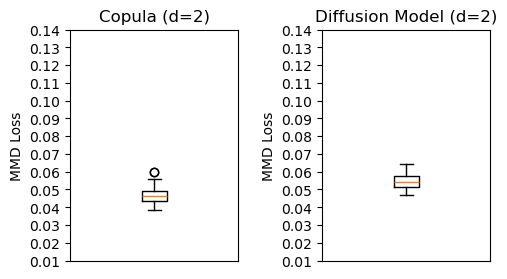

In [99]:
# calculate MMD for Copula and Diffusion Model
MMD_mo_copula2d=MMD_bootstrap(moCopula2d,torch.Tensor(np.array(copula.rCopula(20000,moCopula2d))),B=100,batch_size=5000)
MMD_mo_diffusion2d=MMD_bootstrap(moCopula2d,mo_diff2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_mo_copula2d
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_mo_diffusion2d
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=2)")
print(f"Copula MMD: {np.mean(MMD_mo_copula2d)}, Diffusion Model MMD: {np.mean(MMD_mo_diffusion2d)}")

In [100]:
# save the MMD results
np.save('MMD_mo_copula2d.npy',MMD_mo_copula2d)
np.save('MMD_mo_diffusion2d.npy',MMD_mo_diffusion2d)
# load the MMD results
# MMD_mo_copula2d=np.load('MMD_mo_copula2d.npy')
# MMD_mo_diffusion2d=np.load('MMD_mo_diffusion2d.npy')

In [101]:
# check whether diffusion models can be trained with small number of samples - important for finance usages that have limited data

# Diffusion model for Marshall-Olkin
# sample from the previous copula samples
ind_small=torch.randint(low=0,high=60000,size=(5000,))

# initialize diffusion model with parameters
diff2dsmall=Diffusion(timesteps=10)
diff2dsmall.gen_beta_schedule()
diff2dsmall.calc_alpha()

# initialize neural network
mlp_mo2dsmall=MLP(dim_input=2,dim_output=2)

train_copula_samples(diff2dsmall,mlp_mo2dsmall,ind_mo_samples2d[ind_small,:],uniform_mo_samples2d[ind_small,:],epochs=5000,sampling_size=5000)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.07534830272197723
Epoch 1, Current Loss = 0.0651661828160286
Epoch 2, Current Loss = 0.057654187083244324
Epoch 3, Current Loss = 0.049990326166152954
Epoch 4, Current Loss = 0.04255368560552597
Epoch 5, Current Loss = 0.03760473430156708
Epoch 6, Current Loss = 0.031166918575763702
Epoch 7, Current Loss = 0.027264617383480072
Epoch 8, Current Loss = 0.023202016949653625
Epoch 9, Current Loss = 0.020577115938067436
Epoch 10, Current Loss = 0.017504435032606125
Epoch 11, Current Loss = 0.012366854585707188
Epoch 12, Current Loss = 0.010817386209964752
Epoch 13, Current Loss = 0.008851921185851097
Epoch 14, Current Loss = 0.006544223986566067
Epoch 15, Current Loss = 0.00936621893197298
Epoch 16, Current Loss = 0.004154564347118139
Epoch 17, Current Loss = 0.008253753185272217
Epoch 18, Current Loss = 0.010523203760385513
Epoch 19, Current Loss = 0.010288932360708714
Epoch 20, Current Loss = 0.0038215401582419872
Epoch 21, Current Loss = 0.002003728412091732
Epo

([<matplotlib.axis.YTick at 0x19090291880>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

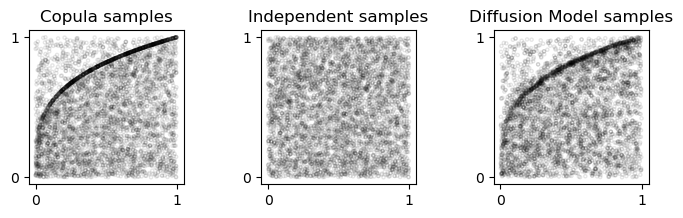

In [102]:
ind=torch.randint(low=0,high=5000,size=(200,))
# dependent samples
x,y=np.array(uniform_mo_samples2d[ind_small,0]),np.array(uniform_mo_samples2d[ind_small,1])
plt.figure(figsize=(8,2))
plt.subplot(1, 3, 1)
plt.scatter(x,y,alpha=0.1, edgecolors='black', facecolors='none',s=5)
plt.title("Copula samples")
plt.xticks([0,1])
plt.yticks([0,1])

plt.subplots_adjust(wspace=0.5)

# independent samples
x,y=np.array(ind_uniform_mo_samples2d[ind_small,0]),np.array(ind_uniform_mo_samples2d[ind_small,1])
plt.subplot(1, 3, 2)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Independent samples")
plt.xticks([0,1])
plt.yticks([0,1])

# generate new samples from neural network
# simulate independent mos
new_mo2d=torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(2),torch.eye(2)).sample(torch.Size([20000]))

# pass the observed data through the reverse decoder to get pseudo copula samples
mo_diff2dsmall=diff2dsmall.undo_noise(new_mo2d)
ind_diff=torch.randint(low=0,high=20000,size=(5000,))
x,y=np.array(mo_diff2dsmall[ind_diff,0]),np.array(mo_diff2dsmall[ind_diff,1])
plt.subplot(1, 3, 3)
plt.scatter(x,y,alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

In [103]:
# to save our Neural network model
torch.save(mlp_mo2dsmall, 'mlp_mo_MSE2dsmall.pth')

# Load the entire model
# mlp_mp2dsmall = torch.load('mlp_mo_MSE2dsmall.pth')
# mlp_gmo2dsmall.eval()  # Set the model to evaluation mode
# diff2dsmall.reverse_decoder=mlp_mo2dsmall

Copula MMD: 0.046129010617733, Diffusion Model MMD: 0.06442568451166153


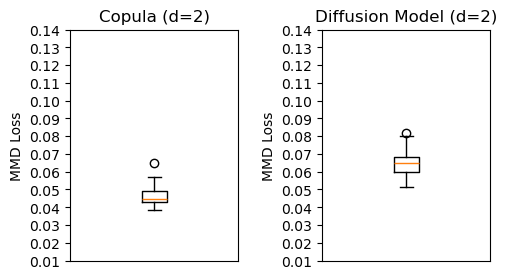

In [104]:
# calculate MMD for Copula and Diffusion Model
MMD_mo_copula2dsmall=MMD_bootstrap(moCopula2d,torch.Tensor(np.array(copula.rCopula(20000,moCopula2d))),B=100,batch_size=5000)
MMD_mo_diffusion2dsmall=MMD_bootstrap(moCopula2d,mo_diff2dsmall,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(6,3))
a=MMD_mo_copula2dsmall
plt.subplot(1, 2, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_mo_diffusion2dsmall
plt.subplot(1, 2, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model (d=2)")
print(f"Copula MMD: {np.mean(MMD_mo_copula2dsmall)}, Diffusion Model MMD: {np.mean(MMD_mo_diffusion2dsmall)}")

In [105]:
# save the MMD results
np.save('MMD_mo_copula2dsmall.npy',MMD_mo_copula2dsmall)
np.save('MMD_mo_diffusion2dsmall.npy',MMD_mo_diffusion2dsmall)
# load the MMD results
# MMD_mo_copula2dsmall=np.load('MMD_mo_copula2dsmall.npy')
# MMD_mo_diffusion2dsmall=np.load('MMD_mo_diffusion2dsmall.npy')

In [106]:
# check whether generalizes to low discrepancy sequence

# instantiate Marshall Olkin copula
moCopula2d=copula.normalCopula(dim=2,p=0.8)

# initialize low discrepancy sequence in torch
ind_uniform_mo_sobol_samples2d=torch.clamp(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0]),scramble=True).draw(100000), min=1e-5, max=1-1e-5)

# transform the uniform, U_ind with quantile function of Marshal Olkin (inverse pdf) to make neural network easier to train (since input is unbounded)
ind_mo_sobol_samples_2d=norm.ppf(ind_uniform_mo_sobol_samples2d)
ind_mo_sobol_samples2d=torch.Tensor(ind_mo_sobol_samples_2d)

# convert the Sobol sequence to a r matrix
ind_uniform_mo_sobol_samples_r2d=r.matrix(ind_uniform_mo_sobol_samples2d.numpy(),nrow=ind_uniform_mo_sobol_samples2d.shape[0],ncol=ind_uniform_mo_sobol_samples2d.shape[1])

# convert U_ind to U'_dep with inverse Rosenblatt transform
uniform_mo_sobol_samples_r2d=copula.cCopula(ind_uniform_mo_sobol_samples_r2d,copula=moCopula2d,inverse=True)
uniform_mo_sobol_samples2d=torch.clamp(torch.Tensor(uniform_mo_sobol_samples_r2d), min=1e-5, max=1-1e-5)

In [107]:
# Diffusion model for Marshall Olkin

# initialize diffusion model with parameters
diffsobol2d=Diffusion(timesteps=10)
diffsobol2d.gen_beta_schedule()
diffsobol2d.calc_alpha()

# initialize neural network
mlp_mosobol2d=MLP(dim_input=2,dim_output=2)

train_copula_samples(diffsobol2d,mlp_mosobol2d,ind_mo_sobol_samples2d,uniform_mo_sobol_samples2d,epochs=500)
# use a small timestep, based on previous tuning that small alpha/ less corruption learns better

Epoch 0, Current Loss = 0.06822831183671951
Epoch 1, Current Loss = 0.060079578310251236
Epoch 2, Current Loss = 0.05113481730222702
Epoch 3, Current Loss = 0.04299715533852577
Epoch 4, Current Loss = 0.036717724055051804
Epoch 5, Current Loss = 0.0324847586452961
Epoch 6, Current Loss = 0.02998395636677742
Epoch 7, Current Loss = 0.023307960480451584
Epoch 8, Current Loss = 0.018060386180877686
Epoch 9, Current Loss = 0.0151854632422328
Epoch 10, Current Loss = 0.012202958576381207
Epoch 11, Current Loss = 0.011440928094089031
Epoch 12, Current Loss = 0.011328622698783875
Epoch 13, Current Loss = 0.009818106889724731
Epoch 14, Current Loss = 0.009932375513017178
Epoch 15, Current Loss = 0.005520600825548172
Epoch 16, Current Loss = 0.006185697391629219
Epoch 17, Current Loss = 0.004820025991648436
Epoch 18, Current Loss = 0.01027998048812151
Epoch 19, Current Loss = 0.007052834145724773
Epoch 20, Current Loss = 0.0035871663130819798
Epoch 21, Current Loss = 0.001428666990250349
Epoch 

In [108]:
# to save our Neural network model
torch.save(mlp_mosobol2d, 'mlp_mosobol_MSE_2d.pth')

# Load the entire model
# mlp_mosobol2d = torch.load('mlp_mosobol_MSE_2d.pth')
# mlp_mosobol2d.eval()  # Set the model to evaluation mode
# diffsobol2d.reverse_decoder=mlp_mosobol2d

Diffusion model MMD: 0.05454254150390625, Copula MMD: 0.04505626857280731, Diffusion Sobol MMD: 0.05376019328832626


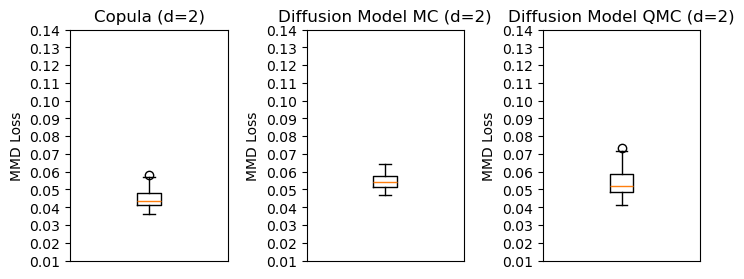

In [ ]:
# generate new samples from neural network
# simulate independent mo
new_mosobol2d=torch.Tensor(norm.ppf(torch.clamp(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
mo_diffsobol2d=diffsobol2d.undo_noise(new_mosobol2d)

# calculate MMD for Copula and Diffusion Model
MMD_mo_copula2d=MMD_bootstrap(moCopula2d,torch.Tensor(np.array(copula.rCopula(20000,moCopula2d))),B=100,batch_size=5000)
MMD_mo_diffusionsobol2d=MMD_bootstrap(moCopula2d,mo_diffsobol2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_mo_copula2d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_mo_diffusion2d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_mo_diffusionsobol2d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=2)")
print(f"Diffusion model MMD: {np.mean(MMD_mo_diffusion2d)}, Copula MMD: {np.mean(MMD_mo_copula2d)}, Diffusion Sobol MMD: {np.mean(MMD_mo_diffusionsobol2d)}")

In [110]:
# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diffsobol2d,n_list=n_list,dim=2,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diffsobol2d,n_list=n_list,dim=2,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diffsobol2d,n_list=n_list,dim=2,qmc=True,level=0.95)

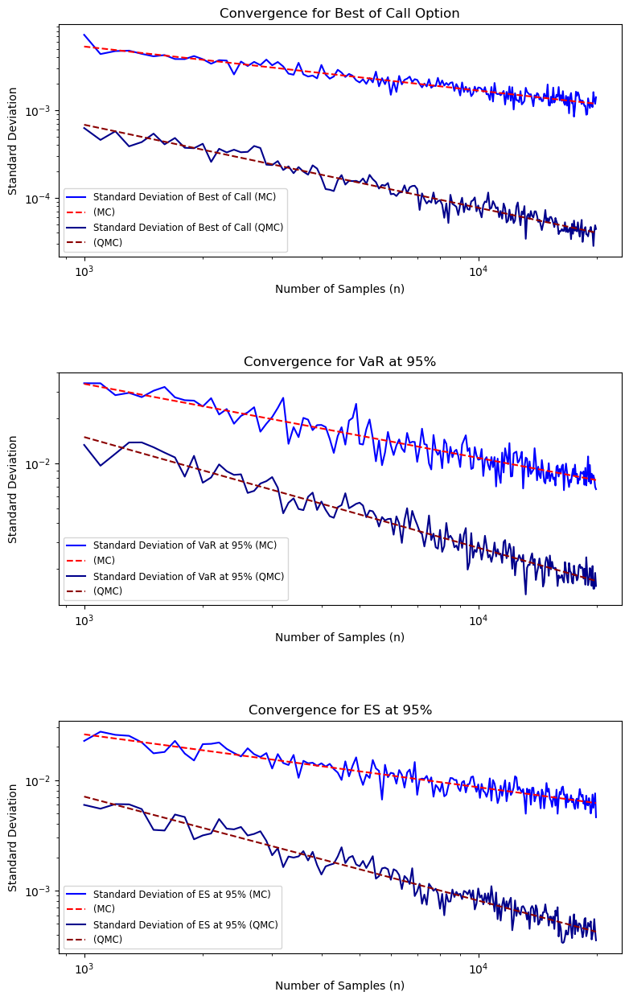

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.5023859531026725
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.9473638324091584
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.4920943885238217
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.7358788476775632
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.4782341100107521
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.9403683446149625


In [111]:
plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

Diffusion model MMD: 0.05454254150390625, Copula MMD: 0.04446316882967949, Diffusion Sobol MMD: 0.26686522364616394


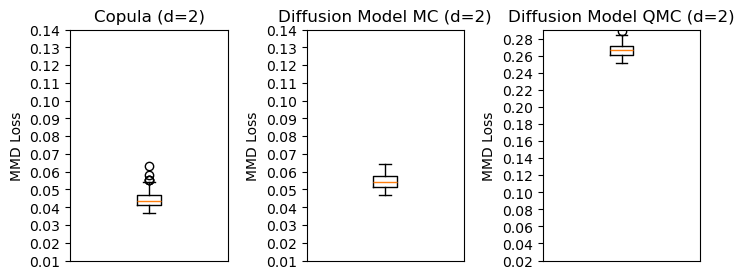

Cell executed in: 5h 43min 37s


In [ ]:
# calculate MMD for Copula and Diffusion Model trained with PRNG but generated with QMC
# generate new samples from neural network
# simulate independent marshall olkin
new_mosobolmc2d=torch.Tensor(norm.ppf(torch.clip(torch.quasirandom.SobolEngine(dimension=2,seed=int(np.random.randint(low=0,high=100000,size=(1,))[0])).draw(20000), min=1e-5, max=1-1e-5)))
mo_diffsobolmc2d=diff2d.undo_noise(new_mosobolmc2d)

MMD_mo_copula2d=MMD_bootstrap(moCopula2d,torch.Tensor(np.array(copula.rCopula(20000,moCopula2d))),B=100,batch_size=5000)
MMD_mo_diffusionsobolmc2d=MMD_bootstrap(moCopula2d,mo_diffsobolmc2d,B=100,batch_size=5000)

# plot out boxplot for MMD for copula samples
plt.figure(figsize=(9,3))
a=MMD_mo_copula2d
plt.subplot(1, 3, 1)
plt.boxplot(a)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Copula (d=2)")

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2)

# plot out boxplot for MMD for diffusion model samples
b=MMD_mo_diffusion2d
plt.subplot(1, 3, 2)
plt.boxplot(b)
plt.xticks([])
plt.yticks(np.arange(0.01,0.15,0.01))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model MC (d=2)")

# plot out boxplot for MMD for diffusion model samples
c=MMD_mo_diffusionsobolmc2d
plt.subplot(1, 3, 3)
plt.boxplot(c)
plt.xticks([])
plt.yticks(np.arange(0.02,0.30,0.02))
plt.ylabel("MMD Loss")
plt.title("Diffusion Model QMC (d=2)")

print(f"Diffusion model MMD: {np.mean(MMD_mo_diffusion2d)}, Copula MMD: {np.mean(MMD_mo_copula2d)}, Diffusion Sobol MMD: {np.mean(MMD_mo_diffusionsobolmc2d)}")

([<matplotlib.axis.YTick at 0x1913f58ab20>,
 [Text(0, 0, '0'), Text(0, 1, '1')])

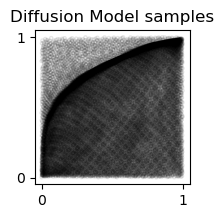

Cell executed in: 6h 6min 50s
Cell executed in: 6h 6min 50s


In [157]:
plt.figure(figsize=(2,2))
plt.scatter(mo_diffsobolmc2d[:,0],mo_diffsobolmc2d[:,1],alpha=0.1,marker='o', edgecolors='black', facecolors='none',s=5)
plt.title("Diffusion Model samples")
plt.xticks([0,1])
plt.yticks([0,1])

In [141]:
# save the MMD results
np.save('MMD_mo_copula_2d.npy',MMD_mo_copula2d)
np.save('MMD_mo_diffusionsobolmc_2d.npy',MMD_mo_diffusionsobolmc2d)

# load the MMD results
# MMD_mo_copula2d=np.load('MMD_mo_copula_2d.npy')
# MMD_mo_diffusionsobol2d=np.load('MMD_mo_diffusionsobolmc_2d.npy')

Cell executed in: 5h 43min 37s


In [142]:
# investigate whether the neural network trained with PRNG can retain QR properties

# range of n to calculate variance for MC and QMC
n_list=np.arange(1000,20000,100,dtype=int)

# Best of Call
# Monte Carlo
_, bof_std_list, bof_mean_list=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,K=0.05)
# Quasi Monte Carlo
_, bof_std_list_, bof_mean_list_=var_risk_measure(best_of_call,diff2d,n_list=n_list,dim=2,qmc=True,K=0.05)

# VaR
# # Monte Carlo
_, VaR_std_list, VaR_mean_list=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, VaR_std_list_, VaR_mean_list_=var_risk_measure(VaR_S,diff2d,n_list=n_list,dim=2,qmc=True,level=0.95)

# ES
# Monte Carlo
_, ES_std_list, ES_mean_list=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,level=0.95)
# Quasi Monte Carlo
_, ES_std_list_, ES_mean_list_=var_risk_measure(ES_S,diff2d,n_list=n_list,dim=2,qmc=True,level=0.95)

Cell executed in: 5h 48min 53s


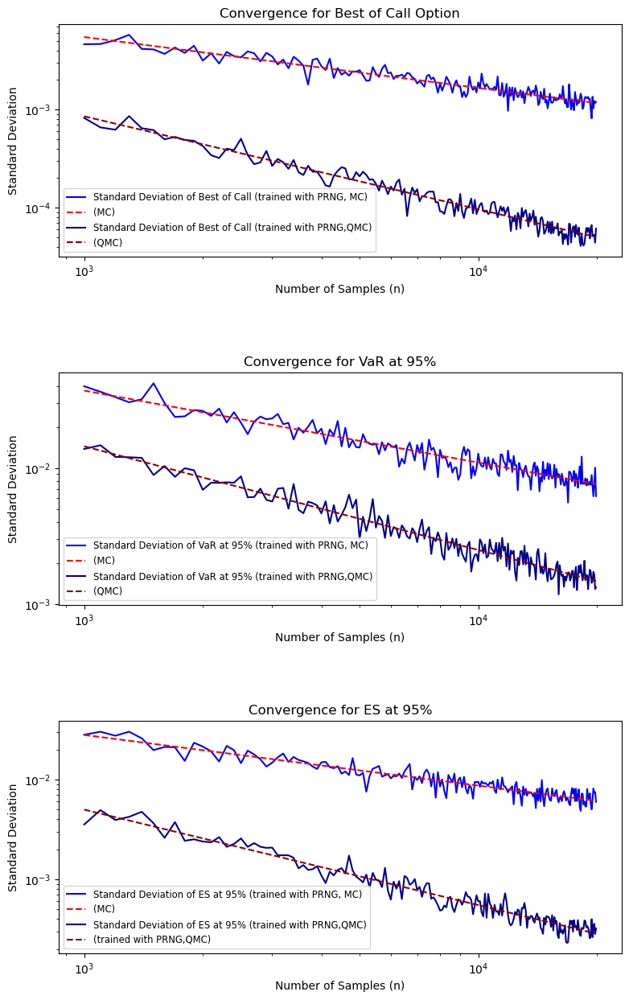

The regression coefficient of the standard deviation estimate for Best of Call (MC) is: -0.5177156116043204
The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: -0.947122279494066
The regression coefficient of the standard deviation estimate for VaR (MC) is: -0.5279698784395975
The regression coefficient of the standard deviation estimate for VaR (QMC) is: -0.7606914073015245
The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: -0.5078766362615097
The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: -0.9569520146915421
Cell executed in: 5h 48min 54s


In [143]:
# Graphs for Diffusion Model trained with PRNG but generating QMC samples

plt.figure(figsize=(10, 15))

# Best of Call convergence
plt.subplot(3, 1, 1)
# MC convergence
plt.loglog(n_list, bof_std_list, label='Standard Deviation of Best of Call (trained with PRNG, MC)', color='blue')
bslope, bintercept, _, _, _=stats.linregress(np.log(n_list),np.log(bof_std_list))
plt.plot(n_list, np.exp(bintercept) * n_list**bslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, bof_std_list_, label='Standard Deviation of Best of Call (trained with PRNG,QMC)', color='darkblue')
bslope_, bintercept_, _, _, std_err_=stats.linregress(np.log(n_list),np.log(bof_std_list_))
plt.plot(n_list,np.exp(bintercept_)*n_list**bslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for Best of Call Option')
plt.legend(fontsize='small',loc='lower left')

# adjust the subplots
plt.subplots_adjust(wspace=0.5,left=0.2,hspace=0.5)

# VaR convergence
plt.subplot(3, 1, 2)
# MC convergence
plt.loglog(n_list, VaR_std_list, label='Standard Deviation of VaR at 95% (trained with PRNG, MC)', color='blue')
vslope, vintercept, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list))
plt.plot(n_list, np.exp(vintercept) * n_list**vslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, VaR_std_list_, label='Standard Deviation of VaR at 95% (trained with PRNG,QMC)', color='darkblue')
vslope_, vintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(VaR_std_list_))
plt.plot(n_list,np.exp(vintercept_)*n_list**vslope_, label='(QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for VaR at 95%')
plt.legend(fontsize='small',loc='lower left')

# Expected Shortfall convergence
plt.subplot(3, 1, 3)
# MC convergence
plt.loglog(n_list, ES_std_list, label='Standard Deviation of ES at 95% (trained with PRNG, MC)', color='blue')
eslope, eintercept, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list))
plt.plot(n_list, np.exp(eintercept) * n_list**eslope, label='(MC)', linestyle="--", color='red') # loosely dashed
# QMC convergence
plt.loglog(n_list, ES_std_list_, label='Standard Deviation of ES at 95% (trained with PRNG,QMC)', color='darkblue')
eslope_, eintercept_, _, _, _=stats.linregress(np.log(n_list),np.log(ES_std_list_))
plt.plot(n_list,np.exp(eintercept_)*n_list**eslope_, label='(trained with PRNG,QMC)', linestyle="--", color='darkred') # densely dashed
# Graphs
plt.xlabel('Number of Samples (n)')
plt.ylabel('Standard Deviation')
plt.title('Convergence for ES at 95%')
plt.legend(fontsize='small',loc='lower left')

plt.show()

# print results
print(f"The regression coefficient of the standard deviation estimate for Best of Call (MC) is: {bslope}")
print(f"The regression coefficient of the standard deviation estimate for Best of Call (QMC) is: {bslope_}")

print(f"The regression coefficient of the standard deviation estimate for VaR (MC) is: {vslope}")
print(f"The regression coefficient of the standard deviation estimate for VaR (QMC) is: {vslope_}")

print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (MC) is: {eslope}")
print(f"The regression coefficient of the standard deviation estimate for Expected Shortfall (QMC) is: {eslope_}")

In [144]:
# record end time
# end=time.time()
# print(f"The time of execution of the program is {end-start} ms")
get_ipython().events.register('post_run_cell', finish_run_cell)

Cell executed in: 5h 48min 54s
Cell executed in: 5h 48min 54s
